## Step 2: Data Preprocessing

## AOI NDVI

In [4]:
import os
import glob
import rasterio
import geopandas as gpd
from rasterio.mask import mask

# --- CONFIGURATION ---
# Path to your folder with full NDVI raster files (one per date)
input_raster_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped"
# Path to your AOI shapefile
aoi_shapefile = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\Huron_Shape\AOI_Huron_24_03\AOI_Huron_24_03.shp"
# Output directory to save clipped rasters
output_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03"
os.makedirs(output_dir, exist_ok=True)

# Load AOI geometry
aoi = gpd.read_file(aoi_shapefile)
aoi = aoi.to_crs(epsg=32617)  # match CRS if needed
geom = [feature["geometry"] for feature in aoi.__geo_interface__["features"]]

# Clip all .tif files in the input directory
for file_path in glob.glob(os.path.join(input_raster_dir, "*.tif")):
    with rasterio.open(file_path) as src:
        clipped_image, clipped_transform = mask(src, geom, crop=True)
        meta = src.meta.copy()

        # Update metadata
        meta.update({
            "driver": "GTiff",
            "height": clipped_image.shape[1],
            "width": clipped_image.shape[2],
            "transform": clipped_transform
        })

        # Output file name
        file_name = os.path.basename(file_path).replace(".tif", "_AOI.tif")
        output_path = os.path.join(output_dir, file_name)

        # Save clipped raster
        with rasterio.open(output_path, "w", **meta) as dest:
            dest.write(clipped_image)

        print(f"✅ Clipped and saved: {output_path}")


✅ Clipped and saved: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\ndvi_01_08_clipped_AOI.tif
✅ Clipped and saved: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\ndvi_05_05_clipped_AOI.tif
✅ Clipped and saved: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\ndvi_07_09_clipped_AOI.tif
✅ Clipped and saved: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\ndvi_14_07_clipped_AOI.tif
✅ Clipped and saved: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\ndvi_15_04_clipped_AOI.tif
✅ Clipped and saved: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\ndvi_24_07_clipped_AOI.tif


## AOI TCI

In [5]:
import os
import glob
import rasterio
import geopandas as gpd
from rasterio.mask import mask

# --- CONFIGURATION ---
# Path to your folder with full NDVI raster files (one per date)
input_raster_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\TCI"
# Path to your AOI shapefile
aoi_shapefile = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\Huron_Shape\AOI_Huron_24_03\AOI_Huron_24_03.shp"
# Output directory to save clipped rasters
output_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\TCI_Clipped_25_03"
os.makedirs(output_dir, exist_ok=True)

# Load AOI geometry
aoi = gpd.read_file(aoi_shapefile)
aoi = aoi.to_crs(epsg=32617)  # match CRS if needed
geom = [feature["geometry"] for feature in aoi.__geo_interface__["features"]]

# Clip all .tif files in the input directory
for file_path in glob.glob(os.path.join(input_raster_dir, "*.tif")):
    with rasterio.open(file_path) as src:
        clipped_image, clipped_transform = mask(src, geom, crop=True)
        meta = src.meta.copy()

        # Update metadata
        meta.update({
            "driver": "GTiff",
            "height": clipped_image.shape[1],
            "width": clipped_image.shape[2],
            "transform": clipped_transform
        })

        # Output file name
        file_name = os.path.basename(file_path).replace(".tif", "_AOI.tif")
        output_path = os.path.join(output_dir, file_name)

        # Save clipped raster
        with rasterio.open(output_path, "w", **meta) as dest:
            dest.write(clipped_image)

        print(f"✅ Clipped and saved: {output_path}")


✅ Clipped and saved: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\TCI_Clipped_25_03\TCI _01_08_AOI.tif
✅ Clipped and saved: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\TCI_Clipped_25_03\TCI_05_05_AOI.tif
✅ Clipped and saved: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\TCI_Clipped_25_03\TCI_07_09_AOI.tif
✅ Clipped and saved: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\TCI_Clipped_25_03\TCI_14_07_AOI.tif
✅ Clipped and saved: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\TCI_Clipped_25_03\TCI_15_04_AOI.tif
✅ Clipped and saved: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\TCI_Clipped_25_03\TCI_24_07_AOI.tif


## NDVI Multi-Band Stack Creation

In [7]:
import rasterio
import numpy as np
import os
from glob import glob

# --- CONFIGURATION ---
input_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03"  # Folder with clipped NDVI rasters
output_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\AOI_NDVI_multidate_stack.tif"
os.makedirs(os.path.dirname(output_path), exist_ok=True)

# --- Collect Input Files (sort by date for consistent band order) ---
ndvi_files = sorted(glob(os.path.join(input_dir, "*.tif")))

# --- Read metadata from the first raster ---
with rasterio.open(ndvi_files[0]) as src:
    meta = src.meta.copy()
    height, width = src.height, src.width
    transform = src.transform
    crs = src.crs

# --- Initialize array to hold all rasters ---
ndvi_stack = []

for ndvi_file in ndvi_files:
    with rasterio.open(ndvi_file) as src:
        ndvi_array = src.read(1)  # read single band
        ndvi_stack.append(ndvi_array)

# --- Convert list to 3D NumPy array: shape = (bands, height, width) ---
ndvi_stack = np.stack(ndvi_stack, axis=0)

# --- Update metadata ---
meta.update({
    "count": len(ndvi_stack),
    "dtype": "float32"
})

# --- Save the stacked raster ---
with rasterio.open(output_path, "w", **meta) as dest:
    dest.write(ndvi_stack.astype("float32"))

print(f"✅ Multi-date NDVI stack created: {output_path}")


✅ Multi-date NDVI stack created: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\AOI_NDVI_multidate_stack.tif


## Entire Huron County

In [4]:
import rasterio
import numpy as np
import os
from glob import glob

# --- CONFIGURATION ---
input_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped"
output_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped\AOI_NDVI_multidate_stack.tif"
os.makedirs(os.path.dirname(output_path), exist_ok=True)

# --- Collect Input Files (sort by date for consistent band order) ---
ndvi_files = sorted(glob(os.path.join(input_dir, "*.tif")))

# --- Read metadata from the first raster ---
with rasterio.open(ndvi_files[0]) as src:
    meta = src.meta.copy()
    height, width = src.height, src.width
    transform = src.transform
    crs = src.crs

# --- Initialize array to hold all rasters ---
ndvi_stack = []

for ndvi_file in ndvi_files:
    with rasterio.open(ndvi_file) as src:
        ndvi_array = src.read(1)  # read single band
        ndvi_stack.append(ndvi_array)

# --- Convert list to 3D NumPy array: shape = (bands, height, width) ---
ndvi_stack = np.stack(ndvi_stack, axis=0)

# --- Update metadata ---
meta.update({
    "count": len(ndvi_stack),
    "dtype": "float32"
})

# --- Save the stacked raster ---
with rasterio.open(output_path, "w", **meta) as dest:
    dest.write(ndvi_stack.astype("float32"))

print(f"✅ Multi-date NDVI stack created: {output_path}")


✅ Multi-date NDVI stack created: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped\AOI_NDVI_multidate_stack.tif


## Coverting Training Field Polygons into a Raster Mask (Label Image)

In [ ]:
import rasterio
import fiona
import numpy as np
from rasterio.features import rasterize

# Paths
ndvi_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\AOI_NDVI_multidate_stack.tif"
vector_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\training_fields.shp"
output_mask_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Field_Boundary_Label\field_boundary_mask.tif"

# Open NDVI raster to get dimensions and transform
with rasterio.open(ndvi_path) as src:
    meta = src.meta.copy()
    transform = src.transform
    out_shape = (src.height, src.width)
    crs = src.crs

# Read field geometries and labels
shapes = []
with fiona.open(vector_path, "r") as shapefile:
    for feature in shapefile:
        geom = feature["geometry"]
        value = int(feature["properties"]["id"])  # Label field
        shapes.append((geom, value))

# Rasterize vector data to create mask
mask = rasterize(
    shapes,
    out_shape=out_shape,
    transform=transform,
    fill=0,
    dtype='uint16'  # Use uint16 if you have >255 fields
)

# Save the mask with correct metadata
meta.update({
    "count": 1,
    "dtype": 'uint16',
    "nodata": 0
})

with rasterio.open(output_mask_path, 'w', **meta) as dst:
    dst.write(mask, 1)

print("✅ Raster mask created:", output_mask_path)



✅ Raster mask created: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Field_Boundary_Label\field_boundary_mask.tif


## Train-Test Data Preparation

In [10]:
import os
import numpy as np
import rasterio
from rasterio.windows import Window
from tqdm import tqdm

# Input paths
ndvi_stack_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\AOI_NDVI_multidate_stack.tif"
mask_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Field_Boundary_Label\field_boundary_mask.tif"

# Output directory
output_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\patches_128x128"
os.makedirs(os.path.join(output_dir, "images"), exist_ok=True)
os.makedirs(os.path.join(output_dir, "masks"), exist_ok=True)

# Patch size
patch_size = 128

# Open NDVI stack and mask
with rasterio.open(ndvi_stack_path) as ndvi_src, rasterio.open(mask_path) as mask_src:
    width, height = ndvi_src.width, ndvi_src.height
    num_bands = ndvi_src.count

    # Slide through the image with stride = patch_size (non-overlapping)
    for i in tqdm(range(0, height, patch_size)):
        for j in range(0, width, patch_size):
            if i + patch_size > height or j + patch_size > width:
                continue  # Skip patches that fall outside

            window = Window(j, i, patch_size, patch_size)

            # Read NDVI patch (multi-band)
            ndvi_patch = ndvi_src.read(window=window)
            # Shape: (bands, patch_size, patch_size)

            # Read corresponding mask patch
            mask_patch = mask_src.read(1, window=window)
            # Shape: (patch_size, patch_size)

            # Save as .npy
            patch_id = f"{i}_{j}"
            np.save(os.path.join(output_dir, "images", f"{patch_id}.npy"), ndvi_patch)
            np.save(os.path.join(output_dir, "masks", f"{patch_id}.npy"), mask_patch)


100%|██████████| 12/12 [00:00<00:00, 136.85it/s]


In [1]:
import os
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"


## Model Training

In [14]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import numpy as np
from PIL import Image
from tqdm import tqdm

# -----------------------------
# 1. Dataset Loader
# -----------------------------
class PatchDataset(Dataset):
    def __init__(self, image_dir, mask_dir):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.image_files = sorted(os.listdir(image_dir))

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image_path = os.path.join(self.image_dir, self.image_files[idx])
        mask_path = os.path.join(self.mask_dir, self.image_files[idx])

        image = np.load(image_path)
        image = (image + 1) / 2.0  # Normalize NDVI from [-1, 1] to [0, 1]
        image = np.clip(image, 0, 1)
        image = torch.tensor(image, dtype=torch.float32)

        if image.ndim == 2:
            image = image.unsqueeze(0)

        mask = np.load(mask_path).astype(np.float32)
        mask = torch.tensor(mask, dtype=torch.float32)

        return image, mask

In [15]:
# -----------------------------
# 2. U-Net Model Definition
# -----------------------------
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.double_conv(x)

class UNet(nn.Module):
    def __init__(self, in_channels=3, n_classes=1):
        super(UNet, self).__init__()
        self.enc1 = DoubleConv(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = DoubleConv(64, 128)
        self.pool2 = nn.MaxPool2d(2)

        self.bottleneck = DoubleConv(128, 256)

        self.upconv2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = DoubleConv(256, 128)
        self.upconv1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = DoubleConv(128, 64)

        self.final = nn.Conv2d(64, n_classes, kernel_size=1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool1(e1))
        b = self.bottleneck(self.pool2(e2))
        d2 = self.upconv2(b)
        d2 = self.dec2(torch.cat([d2, e2], dim=1))
        d1 = self.upconv1(d2)
        d1 = self.dec1(torch.cat([d1, e1], dim=1))
        return self.final(d1)

In [17]:
# -----------------------------
# 3. Training Utilities
# -----------------------------
def init_weights(m):
    if isinstance(m, nn.Conv2d):
        nn.init.kaiming_normal_(m.weight)
        if m.bias is not None:
            nn.init.constant_(m.bias, 0)

def train(model, dataloader, optimizer, criterion, device):
    model.train()
    epoch_loss = 0
    for images, masks in tqdm(dataloader):
        images, masks = images.to(device), masks.to(device)

        optimizer.zero_grad()
        outputs = model(images)

        if torch.isnan(outputs).any() or torch.isinf(outputs).any():
            print("❌ Model outputs contain NaNs or Infs")
            continue

        loss = criterion(outputs.squeeze(), masks)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        epoch_loss += loss.item()
    return epoch_loss / len(dataloader)

In [18]:
# ===========================
# Paths and Parameters
# ===========================
image_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\patches_128x128\images"
mask_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\patches_128x128\masks"

dataset = PatchDataset(image_dir, mask_dir)
dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

In [19]:
# Get input channels from first patch
sample_patch = np.load(os.path.join(image_dir, os.listdir(image_dir)[0]))
in_channels = sample_patch.shape[0] if sample_patch.ndim == 3 else 1

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("🔥 Using device:", device)

model = UNet(in_channels=in_channels, n_classes=1).to(device)
model.apply(init_weights)

criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

epochs = 20
for epoch in range(epochs):
    loss = train(model, dataloader, optimizer, criterion, device)
    print(f"✅ Epoch {epoch+1}/{epochs} - Loss: {loss:.4f}")

# Save model
torch.save(model.state_dict(), "field_boundary_unet.pth")

🔥 Using device: cuda


100%|██████████| 9/9 [00:01<00:00,  6.12it/s]


✅ Epoch 1/20 - Loss: -15.1056


100%|██████████| 9/9 [00:00<00:00, 23.08it/s]


✅ Epoch 2/20 - Loss: -123.2673


100%|██████████| 9/9 [00:00<00:00, 23.83it/s]


✅ Epoch 3/20 - Loss: -656.7047


100%|██████████| 9/9 [00:00<00:00, 23.17it/s]


✅ Epoch 4/20 - Loss: -10851.6939


100%|██████████| 9/9 [00:00<00:00, 23.35it/s]


✅ Epoch 5/20 - Loss: -73995.8849


100%|██████████| 9/9 [00:00<00:00, 23.97it/s]


✅ Epoch 6/20 - Loss: -667124.9384


100%|██████████| 9/9 [00:00<00:00, 23.67it/s]


✅ Epoch 7/20 - Loss: -6175590.3472


100%|██████████| 9/9 [00:00<00:00, 23.15it/s]


✅ Epoch 8/20 - Loss: -22053553.2222


100%|██████████| 9/9 [00:00<00:00, 22.80it/s]


✅ Epoch 9/20 - Loss: -130673691.3333


100%|██████████| 9/9 [00:00<00:00, 23.39it/s]


✅ Epoch 10/20 - Loss: -541079949.3333


100%|██████████| 9/9 [00:00<00:00, 23.31it/s]


✅ Epoch 11/20 - Loss: -1300599985.7778


100%|██████████| 9/9 [00:00<00:00, 23.87it/s]


✅ Epoch 12/20 - Loss: -5266939036.4444


100%|██████████| 9/9 [00:00<00:00, 24.96it/s]


✅ Epoch 13/20 - Loss: -11533776156.4444


100%|██████████| 9/9 [00:00<00:00, 24.75it/s]


✅ Epoch 14/20 - Loss: -35782634268.4444


100%|██████████| 9/9 [00:00<00:00, 24.63it/s]


✅ Epoch 15/20 - Loss: -74829822179.5556


100%|██████████| 9/9 [00:00<00:00, 24.07it/s]


✅ Epoch 16/20 - Loss: -152306347121.7778


100%|██████████| 9/9 [00:00<00:00, 24.00it/s]


✅ Epoch 17/20 - Loss: -395197242709.3333


100%|██████████| 9/9 [00:00<00:00, 23.52it/s]


✅ Epoch 18/20 - Loss: -890842356849.7778


100%|██████████| 9/9 [00:00<00:00, 23.92it/s]


✅ Epoch 19/20 - Loss: -1411093058901.3333


100%|██████████| 9/9 [00:00<00:00, 23.95it/s]

✅ Epoch 20/20 - Loss: -2469222052295.1113


In [ ]:
# ===========================
# Save the Model
# ===========================
torch.save(model.state_dict(), "field_boundary_unet.pth")
print("✅ Model saved as 'field_boundary_unet.pth'")

In [2]:
import geopandas as gpd
import rasterio
from rasterio.features import rasterize
import numpy as np

# Paths to input files
vector_path = r"C:\Users\gagan\OneDrive\Desktop\clipped_geopro.shp"
reference_raster_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\AOI_NDVI_multidate_stack.tif"  # Replace with your actual NDVI stack path
output_mask_path = "field_boundary_mask.tif"

# Load shapefile
gdf = gpd.read_file(vector_path)

# Open reference raster (NDVI stack)
with rasterio.open(reference_raster_path) as src:
    out_meta = src.meta.copy()
    transform = src.transform
    out_shape = (src.height, src.width)
    crs = src.crs

# Rasterize field boundaries: burn value 1 for fields, 0 elsewhere
mask = rasterize(
    [(geom, 1) for geom in gdf.geometry],
    out_shape=out_shape,
    transform=transform,
    fill=0,
    dtype="uint8"
)

# Update metadata for the mask output
out_meta.update({
    "count": 1,
    "dtype": "uint8"
})

# ✅ Remove incompatible nodata value
out_meta.pop("nodata", None)

# Write the binary mask
with rasterio.open(output_mask_path, "w", **out_meta) as dst:
    dst.write(mask.astype("uint8"), 1)

print("✅ Binary mask saved successfully:", output_mask_path)



✅ Binary mask saved successfully: field_boundary_mask.tif


In [5]:
import os
import numpy as np
import rasterio
from rasterio.windows import Window
from rasterio.enums import Resampling
from torch.utils.data import Dataset, DataLoader
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm

# --- 1. Patch Extraction ---
def extract_patches(image_path, mask_path, patch_size, stride, out_image_dir, out_mask_dir):
    os.makedirs(out_image_dir, exist_ok=True)
    os.makedirs(out_mask_dir, exist_ok=True)

    with rasterio.open(image_path) as img_src, rasterio.open(mask_path) as mask_src:
        assert img_src.width == mask_src.width and img_src.height == mask_src.height

        width, height = img_src.width, img_src.height

        patch_id = 0
        for y in range(0, height - patch_size + 1, stride):
            for x in range(0, width - patch_size + 1, stride):
                img_patch = img_src.read(window=Window(x, y, patch_size, patch_size))
                mask_patch = mask_src.read(1, window=Window(x, y, patch_size, patch_size))

                if np.sum(mask_patch) == 0:
                    continue  # Skip empty patches

                np.save(os.path.join(out_image_dir, f"{x}_{y}.npy"), img_patch)
                np.save(os.path.join(out_mask_dir, f"{x}_{y}.npy"), mask_patch)
                patch_id += 1
        print(f"✅ {patch_id} patches extracted.")

In [6]:
# --- 2. Dataset Class ---
class PatchDataset(Dataset):
    def __init__(self, image_dir, mask_dir):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.image_files = sorted(os.listdir(image_dir))

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image = np.load(os.path.join(self.image_dir, self.image_files[idx]))
        mask = np.load(os.path.join(self.mask_dir, self.image_files[idx]))

        return torch.tensor(image, dtype=torch.float32), torch.tensor(mask, dtype=torch.long)

In [7]:
# --- 3. U-Net Model ---
class UNet(nn.Module):
    def __init__(self, in_channels=5, n_classes=2):
        super(UNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )
        self.decoder = nn.Sequential(
            nn.Conv2d(64, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, n_classes, kernel_size=1)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

In [8]:
# --- 4. Training Loop ---
def train(model, dataloader, optimizer, criterion, device):
    model.train()
    epoch_loss = 0

    for images, masks in tqdm(dataloader):
        images, masks = images.to(device), masks.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()

    return epoch_loss / len(dataloader)

In [10]:
import rasterio

image_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Small_AOI_Ndvi_Multidate_Stack.tif"
mask_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Project_Code\field_boundary_mask.tif"

with rasterio.open(image_path) as img_src:
    print("📸 NDVI Image Shape:", img_src.width, img_src.height)

with rasterio.open(mask_path) as mask_src:
    print("🟢 Mask Shape:", mask_src.width, mask_src.height)


📸 NDVI Image Shape: 449 335
🟢 Mask Shape: 892 1475


In [12]:
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
from rasterio.mask import mask
import os

ndvi_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Small_AOI_Ndvi_Multidate_Stack.tif"
mask_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Project_Code\field_boundary_mask.tif"
aligned_mask_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Project_Code\field_boundary_mask_aligned.tif"

# Align mask to NDVI raster
with rasterio.open(ndvi_path) as src_ndvi:
    ndvi_meta = src_ndvi.meta.copy()
    ndvi_transform = src_ndvi.transform
    ndvi_crs = src_ndvi.crs

    with rasterio.open(mask_path) as src_mask:
        mask_data = src_mask.read(1)
        mask_affine = src_mask.transform
        mask_crs = src_mask.crs

        dst_array = np.empty((src_ndvi.height, src_ndvi.width), dtype='uint8')

        reproject(
            source=mask_data,
            destination=dst_array,
            src_transform=mask_affine,
            src_crs=mask_crs,
            dst_transform=ndvi_transform,
            dst_crs=ndvi_crs,
            resampling=Resampling.nearest
        )

        ndvi_meta.update({
            'dtype': 'uint8',
            'count': 1,
            'height': src_ndvi.height,
            'width': src_ndvi.width,
            'transform': ndvi_transform,
            'nodata': 0  # ✅ valid for uint8
        })


        with rasterio.open(aligned_mask_path, 'w', **ndvi_meta) as dst:
            dst.write(dst_array, 1)

print("✅ Mask successfully aligned to NDVI file!")


✅ Mask successfully aligned to NDVI file!


In [14]:
# --- 5. Full Pipeline Execution ---
def run_pipeline():
    image_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Small_AOI_Ndvi_Multidate_Stack.tif"
    mask_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Project_Code\field_boundary_mask_aligned.tif"
    out_image_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\patches\images"
    out_mask_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\patches\masks"

    extract_patches(image_path, mask_path, patch_size=128, stride=64,
                    out_image_dir=out_image_dir, out_mask_dir=out_mask_dir)

    dataset = PatchDataset(out_image_dir, out_mask_dir)
    dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

    in_channels = 5  # Based on NDVI stack
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model = UNet(in_channels=in_channels, n_classes=2).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    for epoch in range(30):
        loss = train(model, dataloader, optimizer, criterion, device)
        print(f"✅ Epoch {epoch + 1}/30 - Loss: {loss:.4f}")

    torch.save(model.state_dict(), "field_boundary_unet.pth")
    print("📦 Model saved to 'field_boundary_unet.pth'")

if __name__ == "__main__":
    run_pipeline()

✅ 24 patches extracted.


100%|██████████| 3/3 [00:00<00:00,  6.38it/s]


✅ Epoch 1/30 - Loss: 0.6269


100%|██████████| 3/3 [00:00<00:00, 78.37it/s]


✅ Epoch 2/30 - Loss: 0.5330


100%|██████████| 3/3 [00:00<00:00, 77.64it/s]


✅ Epoch 3/30 - Loss: 0.5212


100%|██████████| 3/3 [00:00<00:00, 78.80it/s]


✅ Epoch 4/30 - Loss: 0.4997


100%|██████████| 3/3 [00:00<00:00, 78.94it/s]


✅ Epoch 5/30 - Loss: 0.4906


100%|██████████| 3/3 [00:00<00:00, 82.14it/s]


✅ Epoch 6/30 - Loss: 0.4802


100%|██████████| 3/3 [00:00<00:00, 85.71it/s]


✅ Epoch 7/30 - Loss: 0.4643


100%|██████████| 3/3 [00:00<00:00, 83.18it/s]


✅ Epoch 8/30 - Loss: 0.4508


100%|██████████| 3/3 [00:00<00:00, 83.33it/s]


✅ Epoch 9/30 - Loss: 0.4266


100%|██████████| 3/3 [00:00<00:00, 83.33it/s]


✅ Epoch 10/30 - Loss: 0.4131


100%|██████████| 3/3 [00:00<00:00, 85.50it/s]


✅ Epoch 11/30 - Loss: 0.3959


100%|██████████| 3/3 [00:00<00:00, 82.63it/s]


✅ Epoch 12/30 - Loss: 0.3785


100%|██████████| 3/3 [00:00<00:00, 85.70it/s]


✅ Epoch 13/30 - Loss: 0.3632


100%|██████████| 3/3 [00:00<00:00, 83.24it/s]


✅ Epoch 14/30 - Loss: 0.3444


100%|██████████| 3/3 [00:00<00:00, 81.07it/s]


✅ Epoch 15/30 - Loss: 0.3252


100%|██████████| 3/3 [00:00<00:00, 78.36it/s]


✅ Epoch 16/30 - Loss: 0.3058


100%|██████████| 3/3 [00:00<00:00, 80.45it/s]


✅ Epoch 17/30 - Loss: 0.2848


100%|██████████| 3/3 [00:00<00:00, 85.70it/s]


✅ Epoch 18/30 - Loss: 0.2608


100%|██████████| 3/3 [00:00<00:00, 86.90it/s]


✅ Epoch 19/30 - Loss: 0.2386


100%|██████████| 3/3 [00:00<00:00, 83.29it/s]


✅ Epoch 20/30 - Loss: 0.2367


100%|██████████| 3/3 [00:00<00:00, 78.88it/s]


✅ Epoch 21/30 - Loss: 0.2351


100%|██████████| 3/3 [00:00<00:00, 85.17it/s]


✅ Epoch 22/30 - Loss: 0.2303


100%|██████████| 3/3 [00:00<00:00, 75.02it/s]


✅ Epoch 23/30 - Loss: 0.2333


100%|██████████| 3/3 [00:00<00:00, 85.66it/s]


✅ Epoch 24/30 - Loss: 0.2247


100%|██████████| 3/3 [00:00<00:00, 82.01it/s]


✅ Epoch 25/30 - Loss: 0.2117


100%|██████████| 3/3 [00:00<00:00, 84.42it/s]


✅ Epoch 26/30 - Loss: 0.2089


100%|██████████| 3/3 [00:00<00:00, 83.17it/s]


✅ Epoch 27/30 - Loss: 0.2103


100%|██████████| 3/3 [00:00<00:00, 85.70it/s]


✅ Epoch 28/30 - Loss: 0.2037


100%|██████████| 3/3 [00:00<00:00, 86.07it/s]


✅ Epoch 29/30 - Loss: 0.2023


100%|██████████| 3/3 [00:00<00:00, 76.75it/s]

✅ Epoch 30/30 - Loss: 0.2016
📦 Model saved to 'field_boundary_unet.pth'


## Model Visualization

In [22]:
import os
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, Dataset

# Dataset class
class PatchDataset(Dataset):
    def __init__(self, image_dir, mask_dir):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.image_files = sorted(os.listdir(image_dir))
        self.mask_files = sorted(os.listdir(mask_dir))

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image_path = os.path.join(self.image_dir, self.image_files[idx])
        mask_path = os.path.join(self.mask_dir, self.mask_files[idx])
        image = np.load(image_path)
        mask = np.load(mask_path)
        return torch.tensor(image, dtype=torch.float32), torch.tensor(mask, dtype=torch.long)

# Model definition
class UNet(nn.Module):
    def __init__(self, in_channels, n_classes):
        super(UNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )
        self.decoder = nn.Sequential(
            nn.Conv2d(64, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, n_classes, kernel_size=1)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


In [23]:
# Paths
image_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\patches\images"
mask_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\patches\masks"
model_path = r"field_boundary_unet.pth"

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load dataset
# Determine input channels from a sample image patch
sample_image_path = os.path.join(image_dir, sorted(os.listdir(image_dir))[0])
sample_patch = np.load(sample_image_path)

# Confirm patch dimensions
if sample_patch.ndim == 3:
    in_channels = sample_patch.shape[0]
else:
    raise ValueError(f"Expected 3D patch but got shape {sample_patch.shape}")

# Initialize dataset and dataloader
dataset = PatchDataset(image_dir, mask_dir)
dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

print(f"📦 Dataset loaded with {len(dataset)} patches and {in_channels} input channels")

📦 Dataset loaded with 24 patches and 5 input channels


In [24]:
# Load model
model = UNet(in_channels=5, n_classes=2).to(device)
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()

print("✅ Model successfully loaded!")

✅ Model successfully loaded!


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.048231512..0.9312223].


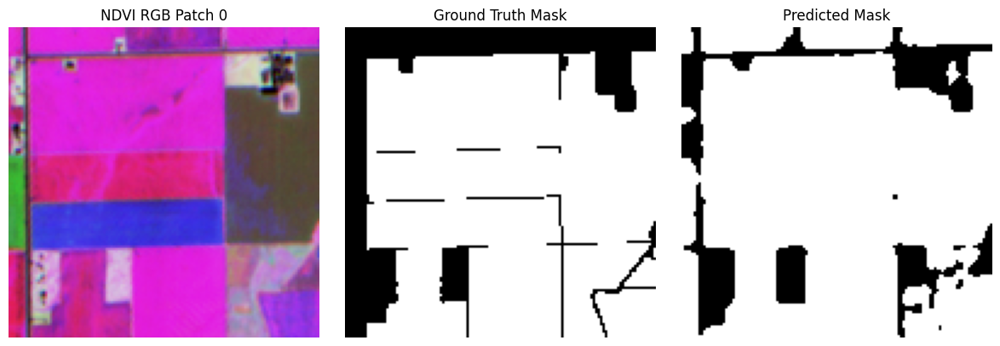

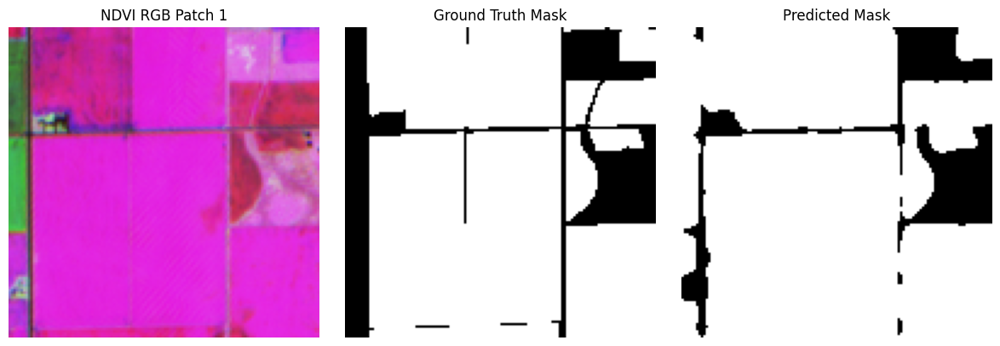

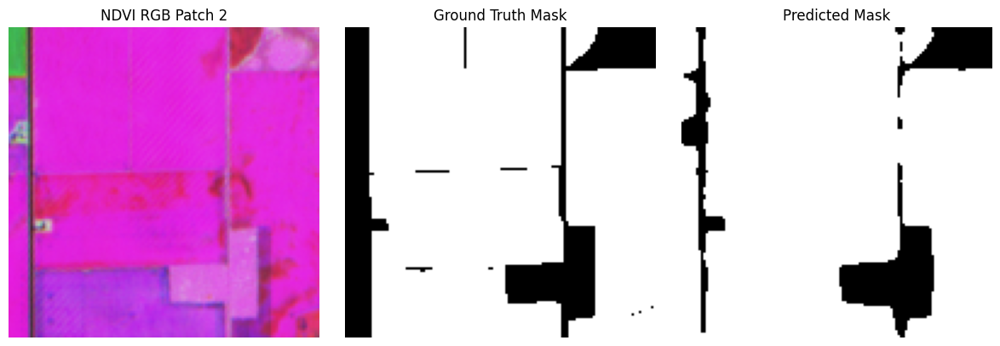

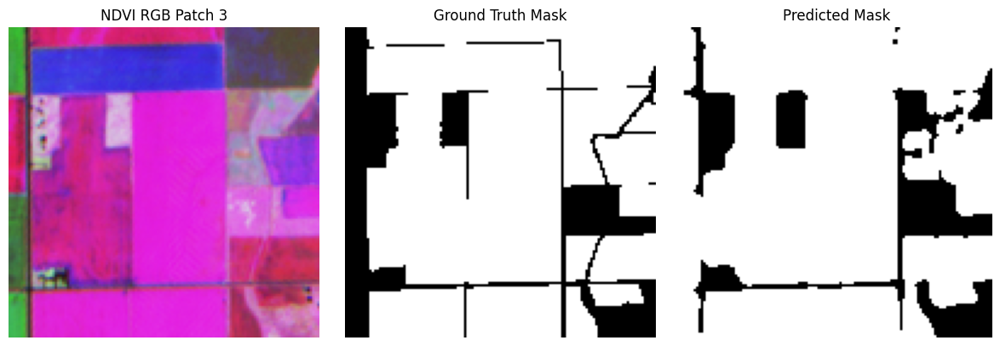

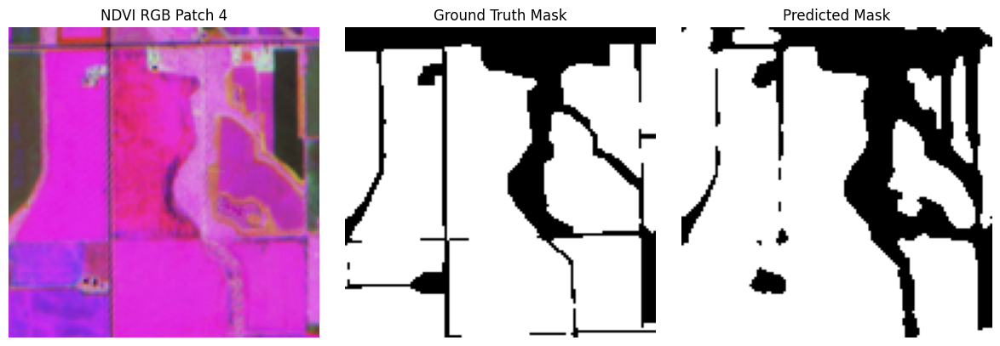

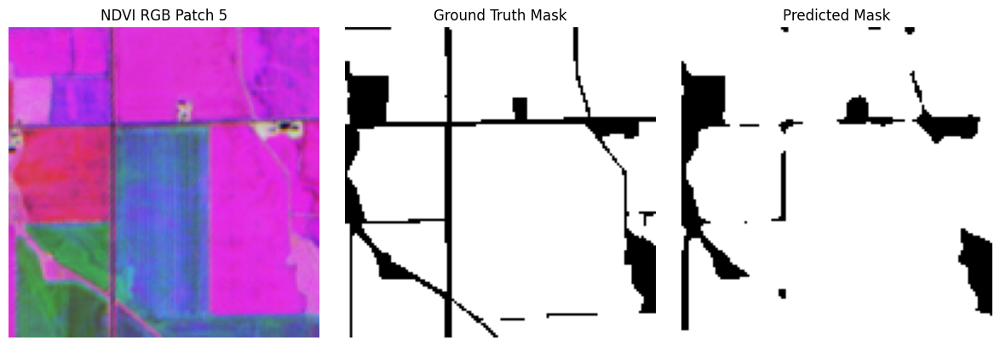

In [25]:
import matplotlib.pyplot as plt
import torch.nn.functional as F

# Function to visualize prediction
def visualize_prediction(image, gt_mask, pred_mask, idx):
    plt.figure(figsize=(12, 4))

    # NDVI image as 3-band RGB (choose first 3 bands)
    rgb_image = image[:3, :, :]  # Shape: [3, 128, 128]
    rgb_image = rgb_image.permute(1, 2, 0).cpu().numpy()

    plt.subplot(1, 3, 1)
    plt.imshow(rgb_image)
    plt.title(f"NDVI RGB Patch {idx}")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(gt_mask.cpu().squeeze(), cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask.cpu().squeeze(), cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


# Run inference on patches
model.eval()
with torch.no_grad():
    for idx, (image, gt_mask) in enumerate(dataloader):
        image = image.to(device)
        output = model(image)
        pred_mask = torch.argmax(output, dim=1)  # Shape: [B, 128, 128]

        visualize_prediction(image[0], gt_mask[0], pred_mask[0], idx)

        if idx == 5:  # Show only first 6 patches
            break


## Visualization & Save Predicted Outputs

In [32]:
import os
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image
import torch

# Custom Dataset class
class PatchDataset(torch.utils.data.Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.image_files = sorted(os.listdir(image_dir))
        self.mask_files = sorted(os.listdir(mask_dir))
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image = np.load(os.path.join(self.image_dir, self.image_files[idx]))
        mask = np.load(os.path.join(self.mask_dir, self.mask_files[idx]))

        if self.transform:
            image = self.transform(image)

        image = torch.from_numpy(image).float()
        mask = torch.from_numpy(mask).long()
        return image, mask

# Define paths
image_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\patches\images"
mask_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\patches\masks"
save_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\patches\visual_output_predictions"

os.makedirs(save_dir, exist_ok=True)

# Load model
model_path = r"field_boundary_unet.pth"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Get number of input channels from one patch
sample_patch = np.load(os.path.join(image_dir, os.listdir(image_dir)[0]))
in_channels = sample_patch.shape[0] if sample_patch.ndim == 3 else 1

# Load dataset and model
dataset = PatchDataset(image_dir, mask_dir)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=False)

# from model import UNet  # Make sure UNet is defined somewhere
class UNet(nn.Module):
    def __init__(self, in_channels, n_classes):
        super(UNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )
        self.decoder = nn.Sequential(
            nn.Conv2d(64, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, n_classes, kernel_size=1)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


model = UNet(in_channels=in_channels, n_classes=2).to(device)
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()

# Visualize and Save outputs
num_samples = 6  # Number of samples to visualize/save
for idx, (image, mask) in enumerate(dataloader):
    if idx >= num_samples:
        break

    image = image.to(device)
    with torch.no_grad():
        output = model(image)
        pred = torch.argmax(output, dim=1).cpu().squeeze(0).numpy()

    # Convert input image (1st band) to 2D for display
    image_np = image.cpu().squeeze(0).numpy()[0]

    # Save visualization
    fig, ax = plt.subplots(1, 3, figsize=(12, 4))
    ax[0].imshow(image_np, cmap='gray')
    ax[0].set_title("NDVI Input (Band 1)")

    ax[1].imshow(mask.squeeze(0).cpu().numpy(), cmap='gray')
    ax[1].set_title("Ground Truth")

    ax[2].imshow(pred, cmap='gray')
    ax[2].set_title("Prediction")

    for a in ax:
        a.axis('off')

    plt.tight_layout()
    save_path = os.path.join(save_dir, f"prediction_{idx}.png")
    plt.savefig(save_path)
    plt.close()

    print(f"📸 Saved prediction visualization: {save_path}")


📸 Saved prediction visualization: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\patches\visual_output_predictions\prediction_0.png
📸 Saved prediction visualization: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\patches\visual_output_predictions\prediction_1.png
📸 Saved prediction visualization: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\patches\visual_output_predictions\prediction_2.png
📸 Saved prediction visualization: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\patches\visual_output_predictions\prediction_3.png
📸 Saved prediction visualization: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\patches\visual_output_predictions\prediction_4.png
📸 Saved prediction visualization: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\patches\visual_output_predictio

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.048231512..0.9312223].


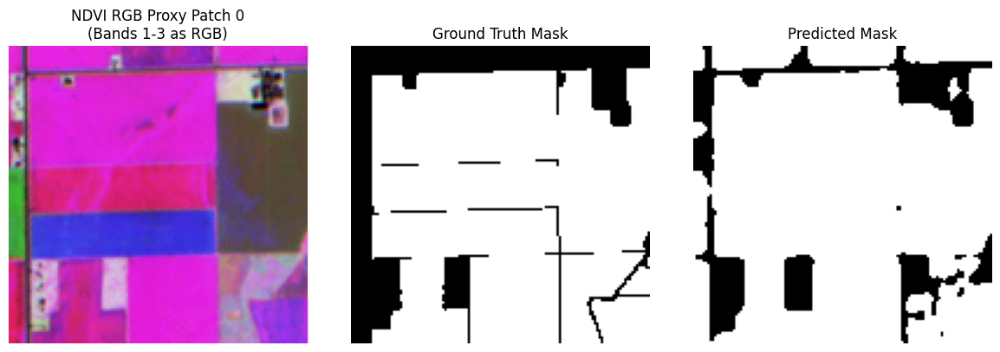

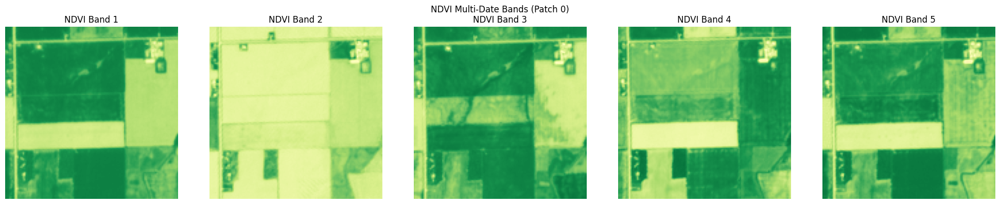

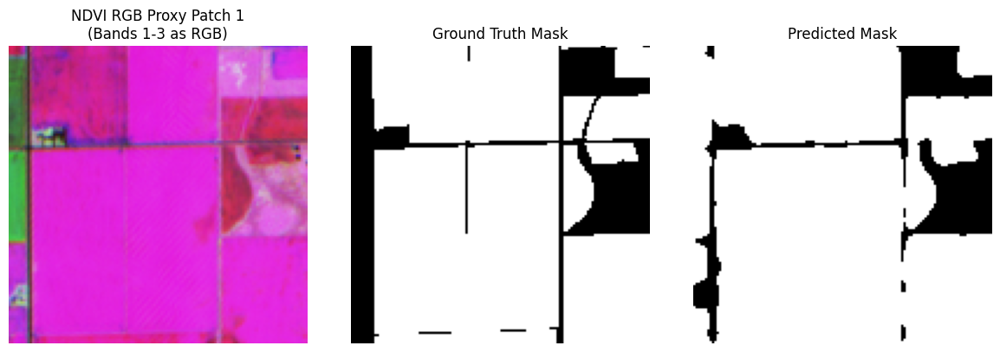

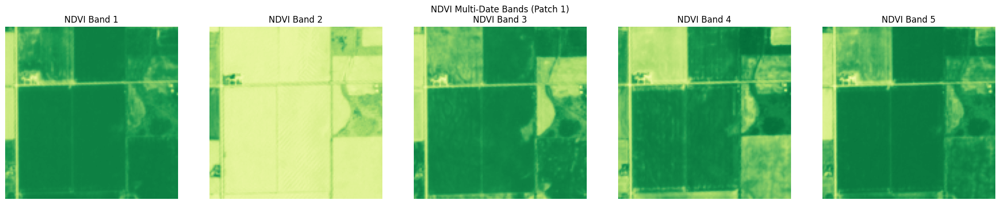

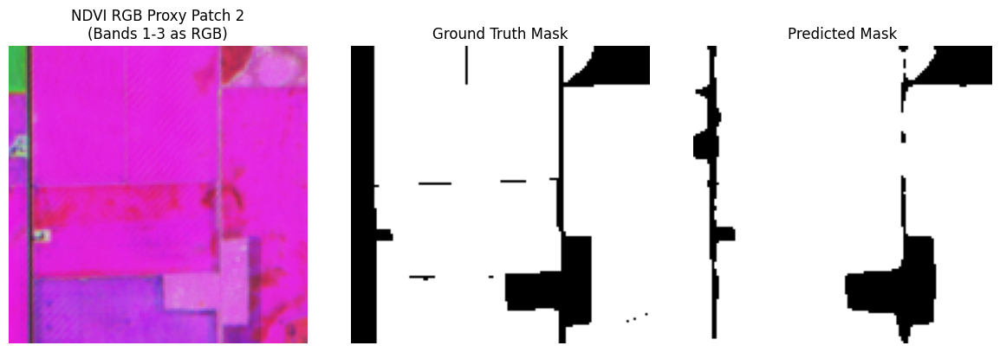

...

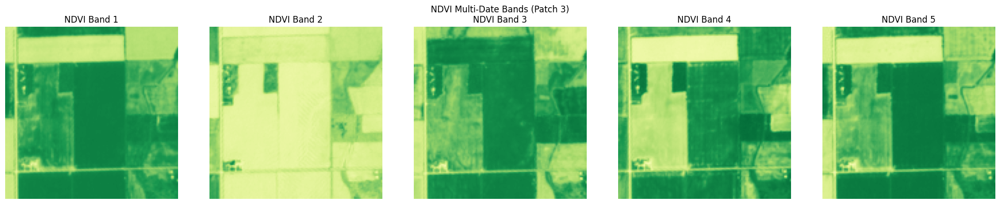

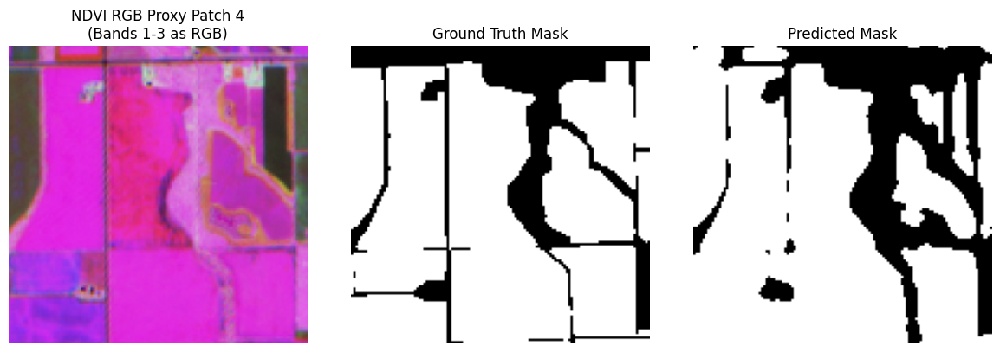

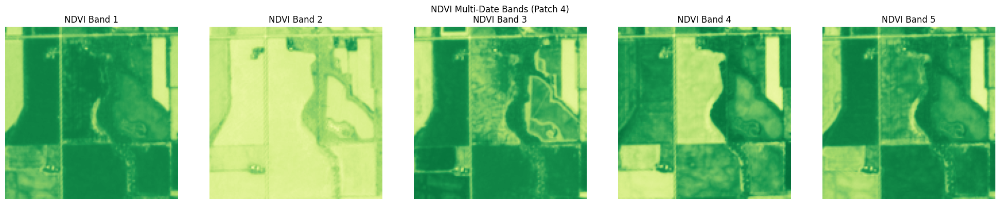

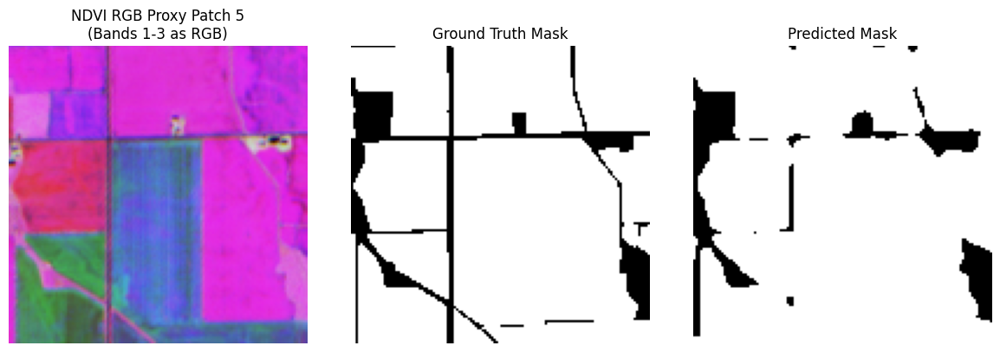

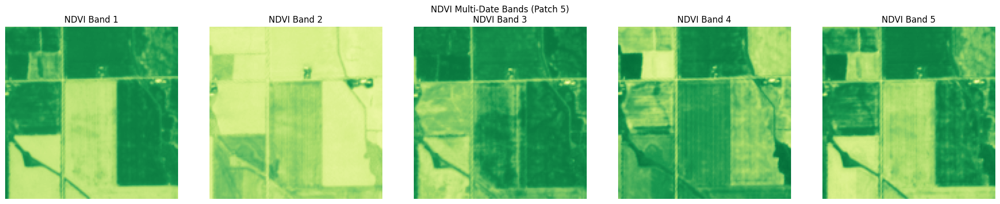

In [ ]:
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F

# 📌 Show RGB-style NDVI (Bands 1-3), Ground Truth, Prediction
def visualize_prediction(image, gt_mask, pred_mask, idx):
    plt.figure(figsize=(12, 4))

    # RGB-style NDVI (Bands 1, 2, 3)
    rgb_image = image[:3, :, :]
    rgb_image = rgb_image.permute(1, 2, 0).cpu().numpy()

    plt.subplot(1, 3, 1)
    plt.imshow(rgb_image)
    plt.title(f"NDVI RGB Proxy Patch {idx}\n(Bands 1-3 as RGB)")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(gt_mask.cpu().squeeze(), cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask.cpu().squeeze(), cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# 📌 Show all 5 bands of NDVI for the patch
def visualize_all_ndvi_bands(image, idx):
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    for i in range(5):
        axes[i].imshow(image[i].cpu(), cmap='RdYlGn', vmin=-1, vmax=1)
        axes[i].set_title(f"NDVI Band {i+1}")
        axes[i].axis("off")
    plt.suptitle(f"NDVI Multi-Date Bands (Patch {idx})")
    plt.tight_layout()
    plt.show()

# 🧪 Run inference on patches
model.eval()
with torch.no_grad():
    for idx, (image, gt_mask) in enumerate(dataloader):
        image = image.to(device)
        output = model(image)
        pred_mask = torch.argmax(output, dim=1)

        # Visualizations
        visualize_prediction(image[0], gt_mask[0], pred_mask[0], idx)
        visualize_all_ndvi_bands(image[0], idx)

        if idx == 5:  # Show only first 6 patches
            break


## Evaluation Metrics

In [39]:
import torch
print("CUDA available:", torch.cuda.is_available())
print("Device name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU only")


CUDA available: True
Device name: NVIDIA GeForce RTX 4060 Ti


In [40]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.048231512..0.9312223].


🔥 Using device: cuda
✅ Model loaded successfully!


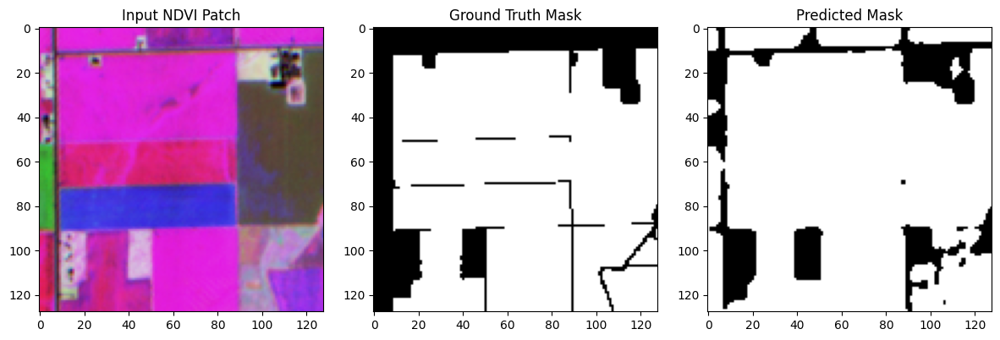

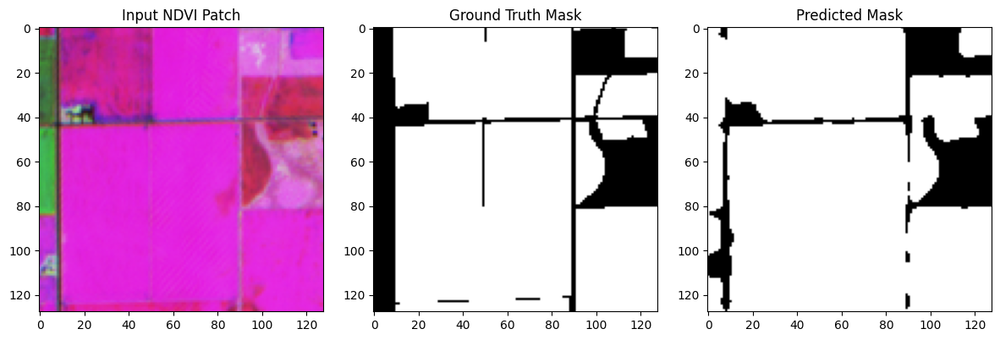

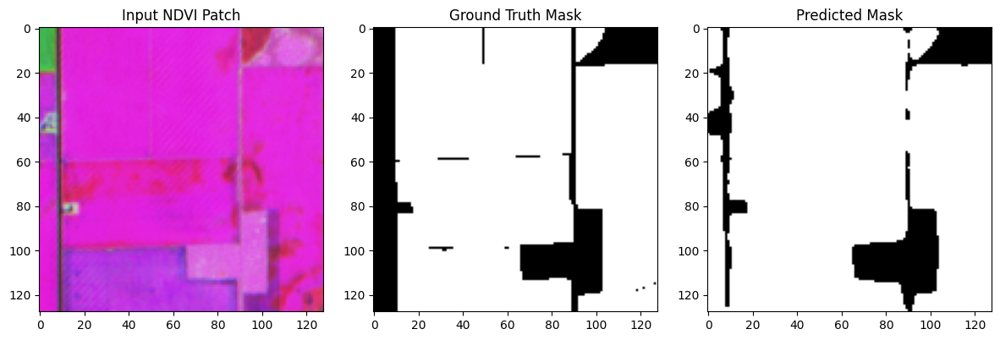

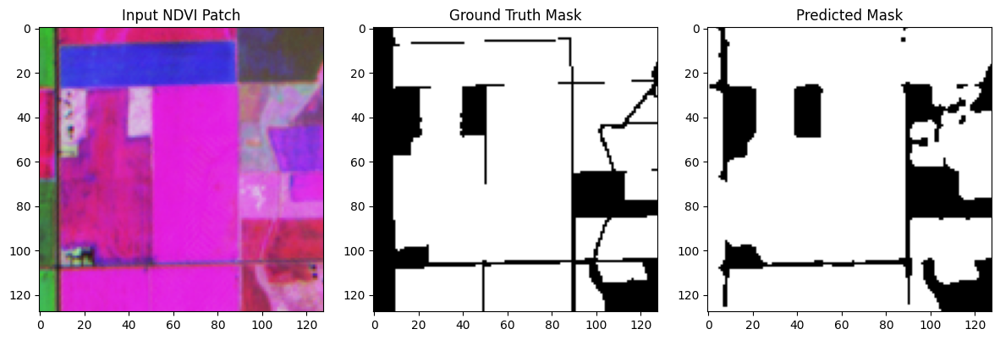

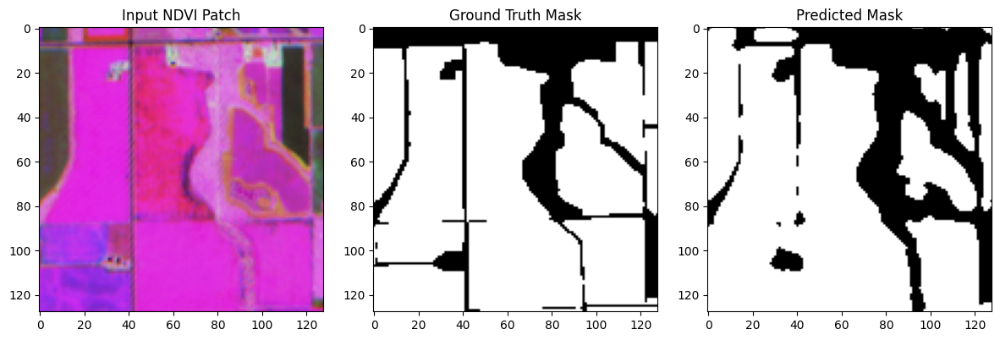

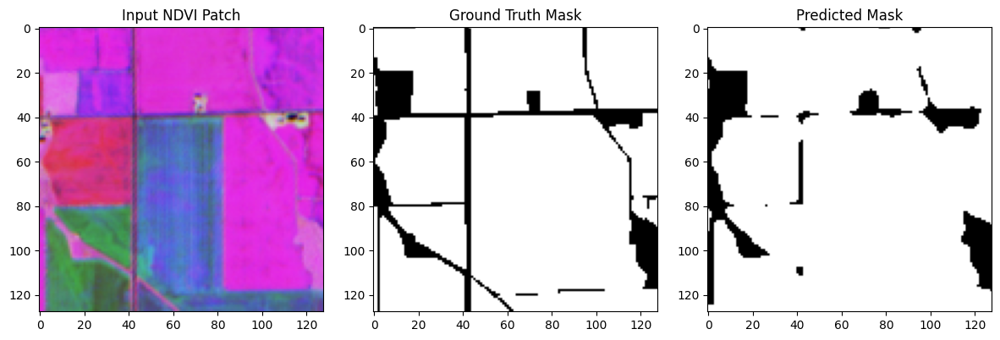

In [41]:
import torch
import numpy as np
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
# from dataset import PatchDataset  # Replace with your actual dataset class
# from model import UNet            # Replace with your actual model

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("🔥 Using device:", device)

class PatchDataset(torch.utils.data.Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.image_files = sorted(os.listdir(image_dir))
        self.mask_files = sorted(os.listdir(mask_dir))
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image = np.load(os.path.join(self.image_dir, self.image_files[idx]))
        mask = np.load(os.path.join(self.mask_dir, self.mask_files[idx]))

        if self.transform:
            image = self.transform(image)

        image = torch.from_numpy(image).float()
        mask = torch.from_numpy(mask).long()
        return image, mask


# Paths
model_path = r"field_boundary_unet.pth"
image_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\patches\images"
mask_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\patches\masks"

# Dataset and DataLoader
sample_patch = np.load(os.path.join(image_dir, os.listdir(image_dir)[0]))
in_channels = sample_patch.shape[0] if sample_patch.ndim == 3 else 1

dataset = PatchDataset(image_dir, mask_dir)
dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

# Load model
class UNet(nn.Module):
    def __init__(self, in_channels, n_classes):
        super(UNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )
        self.decoder = nn.Sequential(
            nn.Conv2d(64, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, n_classes, kernel_size=1)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

model = UNet(in_channels=in_channels, n_classes=2).to(device)
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()
print("✅ Model loaded successfully!")

# Evaluation loop with visualization
with torch.no_grad():
    for idx, (image, gt_mask) in enumerate(dataloader):
        image = image.to(device)
        gt_mask = gt_mask.to(device)

        output = model(image)
        pred_mask = torch.argmax(output, dim=1)

        # Visualize
        rgb = image[0][:3].permute(1, 2, 0).cpu().numpy()
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 3, 1)
        plt.imshow(rgb)
        plt.title("Input NDVI Patch")

        plt.subplot(1, 3, 2)
        plt.imshow(gt_mask[0].cpu().squeeze(), cmap="gray")
        plt.title("Ground Truth Mask")

        plt.subplot(1, 3, 3)
        plt.imshow(pred_mask[0].cpu().squeeze(), cmap="gray")
        plt.title("Predicted Mask")

        plt.tight_layout()
        plt.show()

        if idx == 5:
            break


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.048231512..0.9312223].


🔥 Using device: cuda
✅ Model loaded successfully!


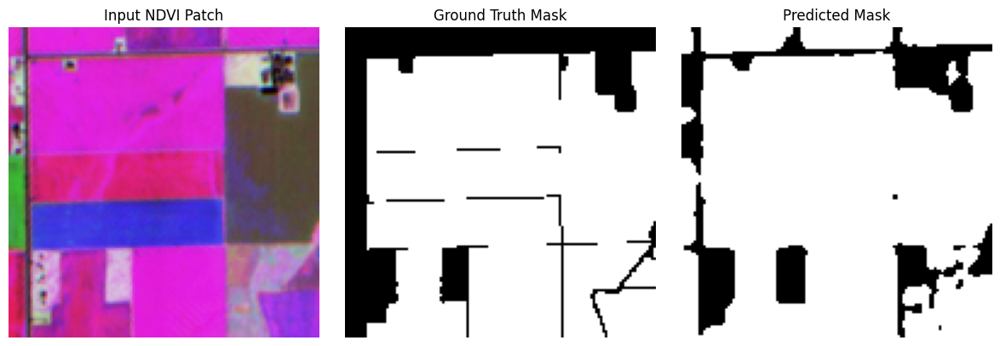

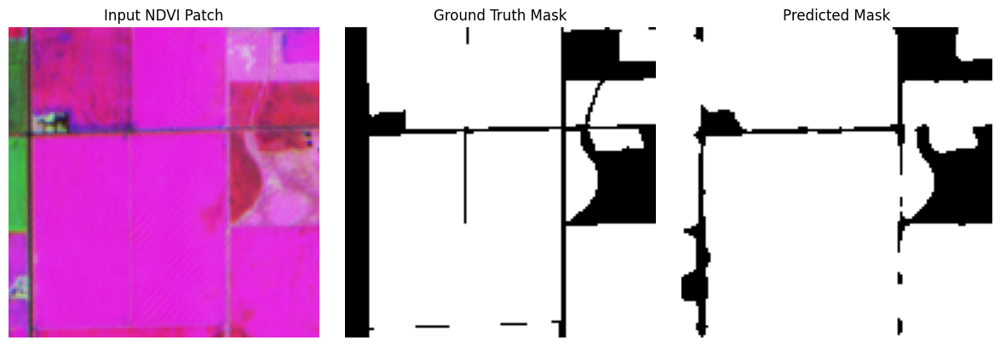

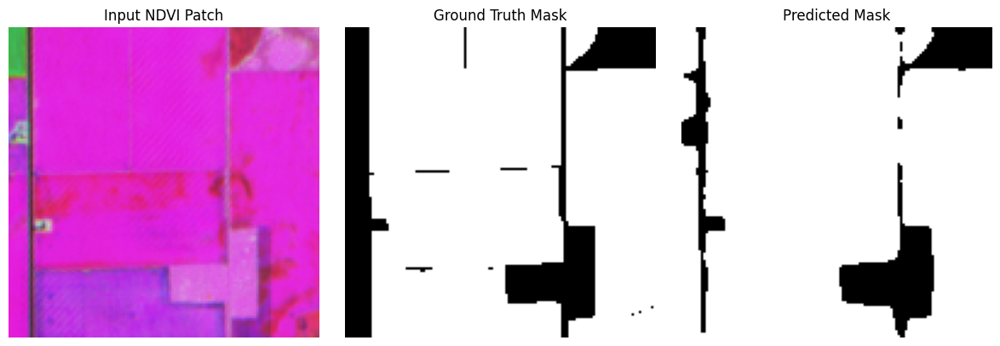

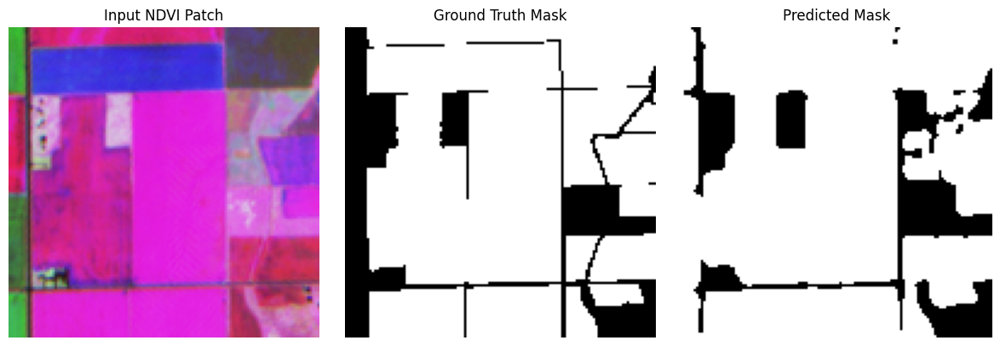

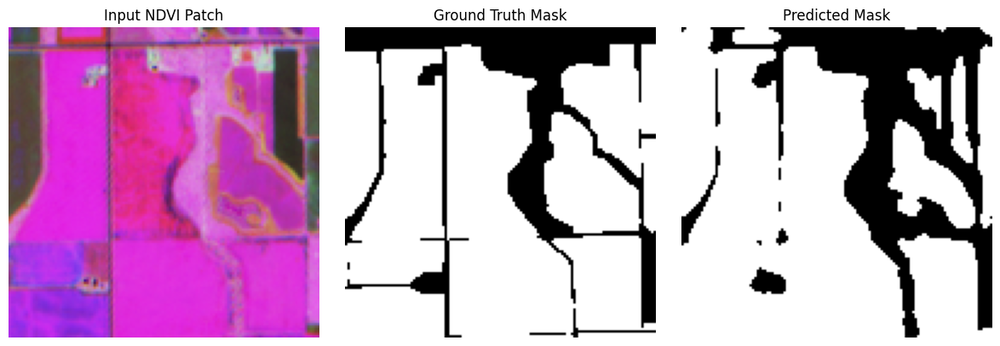

...

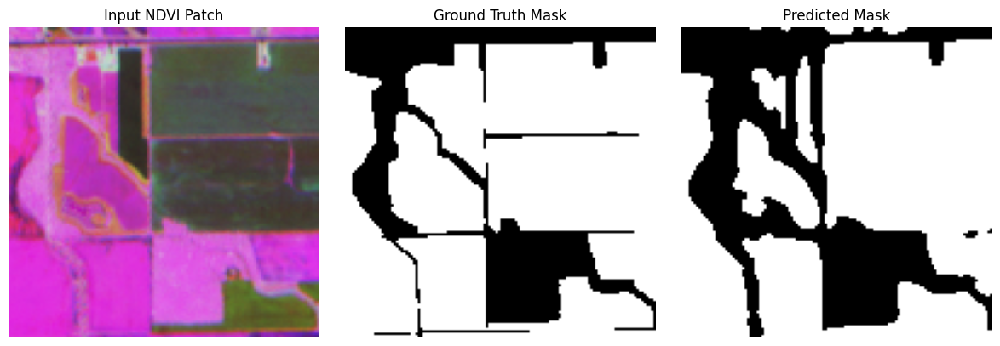

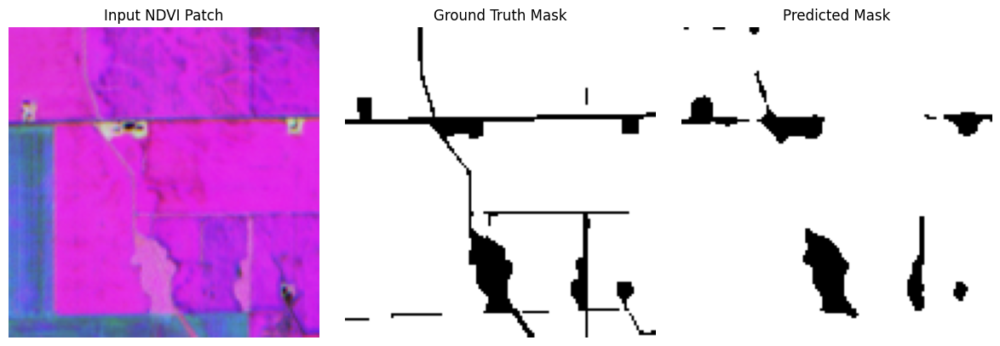

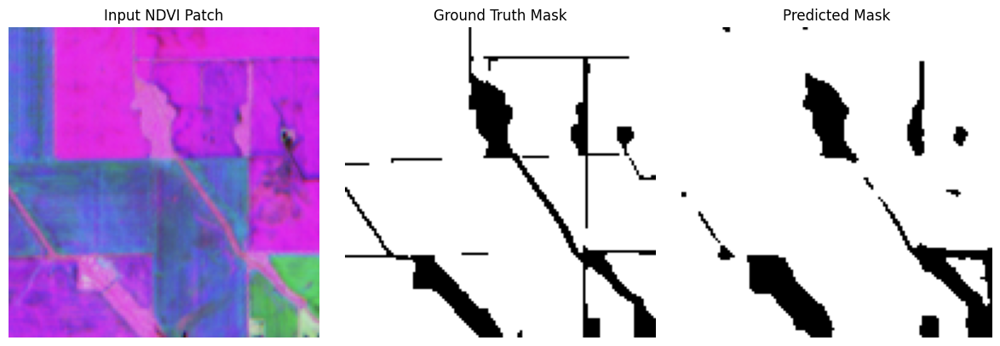

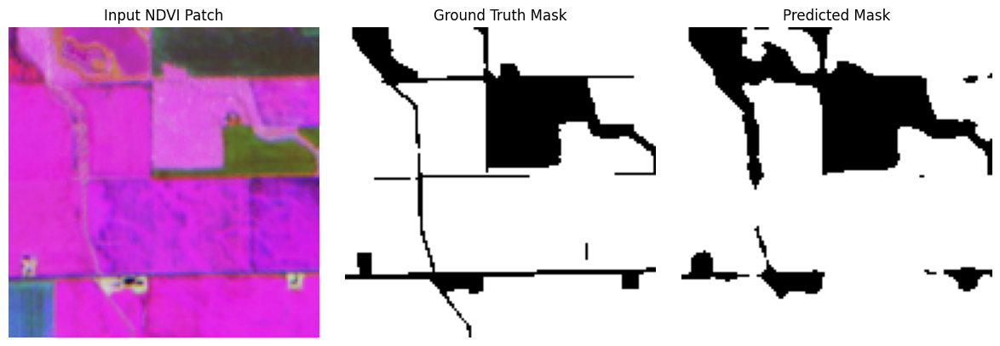

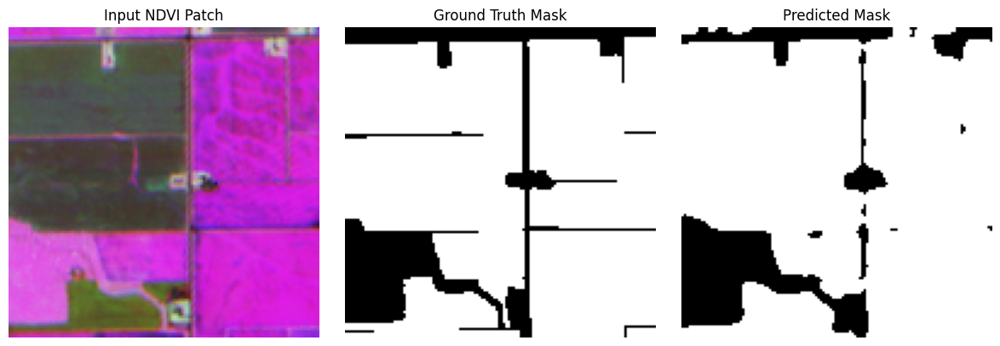

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12113402..0.93333334].


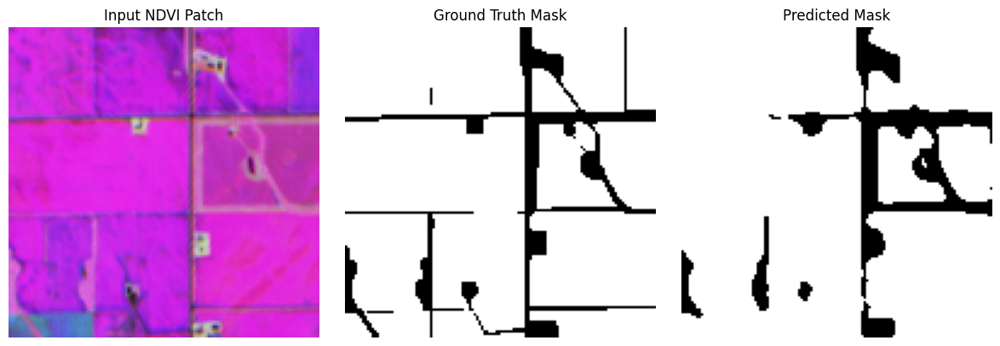

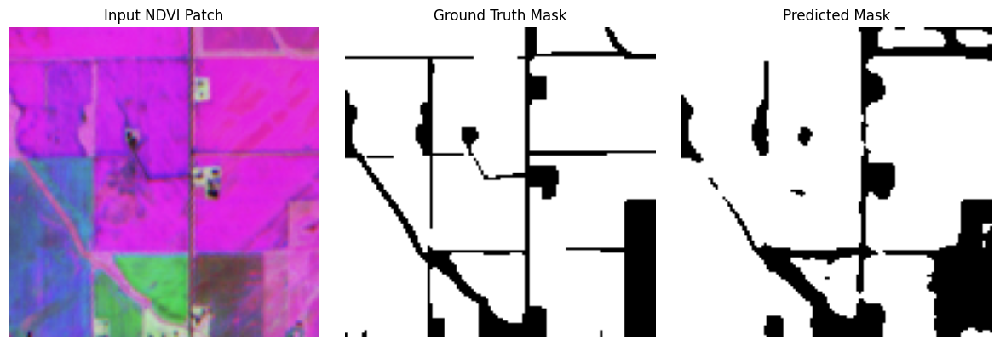

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12113402..0.92754614].


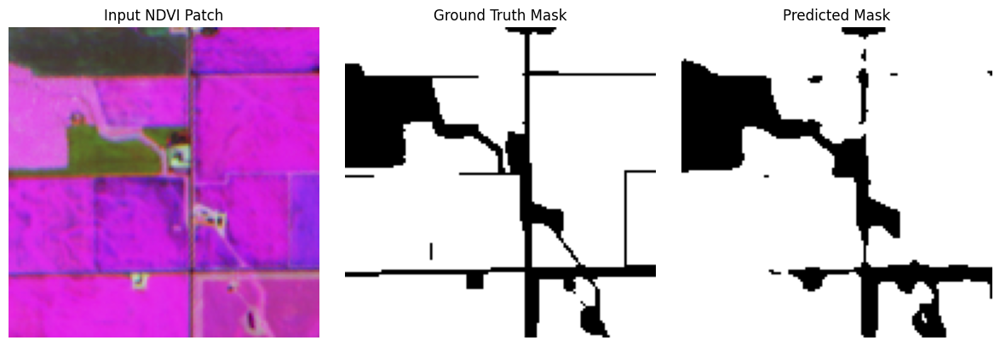

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.34224048..0.927377].


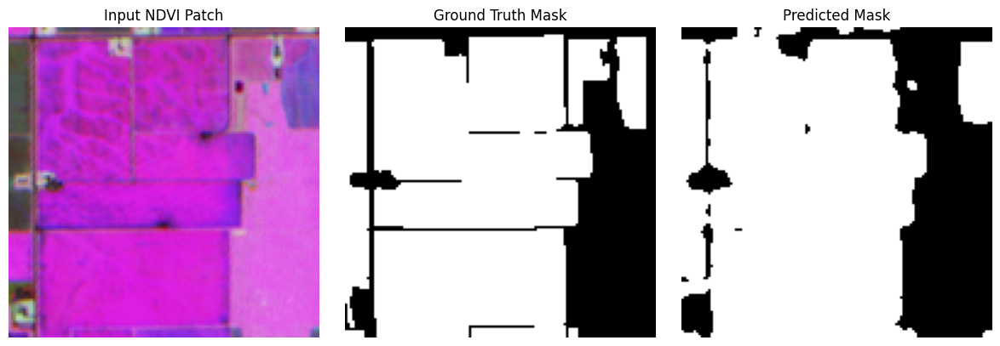

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12113402..0.93333334].


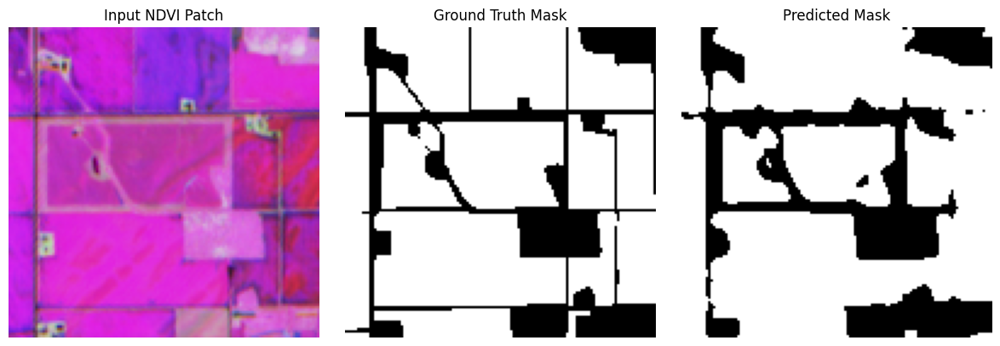

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.24590164..0.93333334].


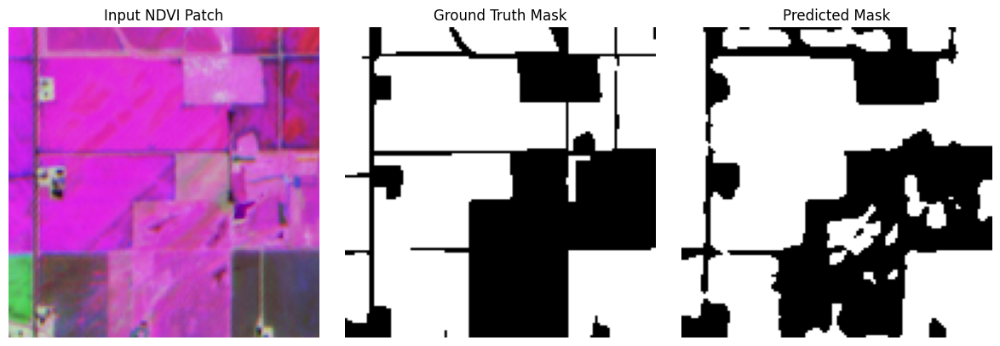

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12113402..0.92754614].


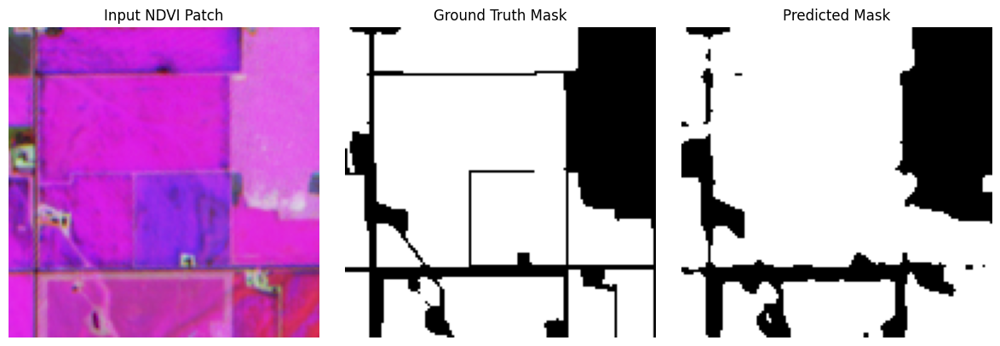

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.048231512..0.9419032].


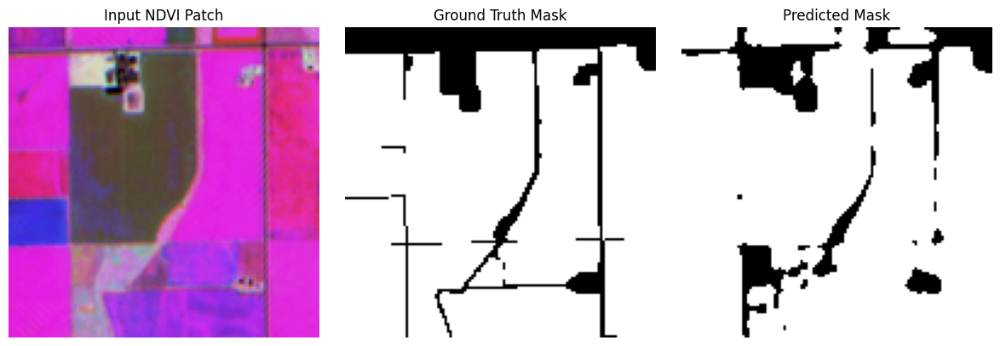

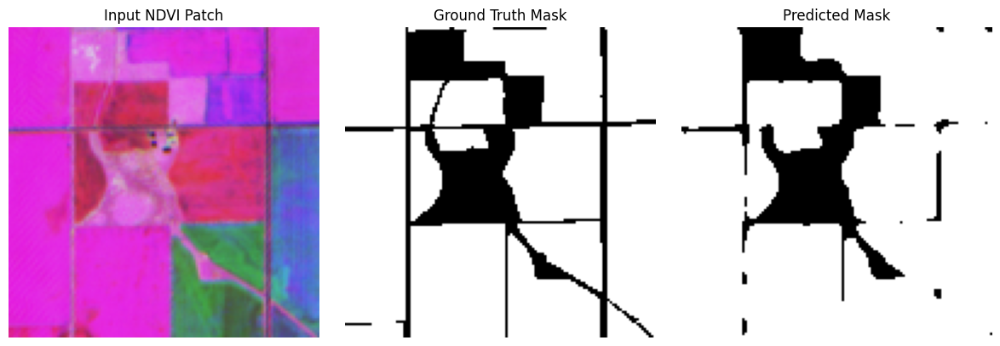

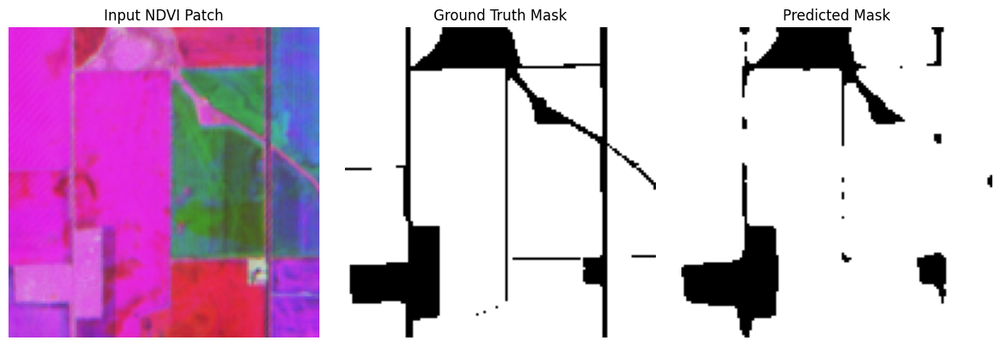

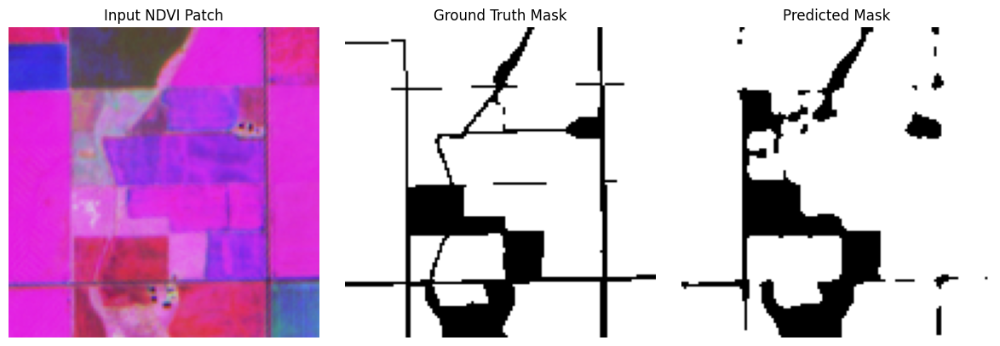


📊 Evaluation Metrics:
✅ Pixel Accuracy: 0.9212
✅ IoU (Jaccard Index): 0.9072
✅ Dice Coefficient: 0.9514


In [ ]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from sklearn.metrics import confusion_matrix
import torch.nn as nn

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("🔥 Using device:", device)

# Custom dataset class
class PatchDataset(torch.utils.data.Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.image_files = sorted(os.listdir(image_dir))
        self.mask_files = sorted(os.listdir(mask_dir))
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image = np.load(os.path.join(self.image_dir, self.image_files[idx]))
        mask = np.load(os.path.join(self.mask_dir, self.mask_files[idx]))

        if self.transform:
            image = self.transform(image)

        image = torch.from_numpy(image).float()
        mask = torch.from_numpy(mask).long()
        return image, mask

# UNet model definition
class UNet(nn.Module):
    def __init__(self, in_channels, n_classes):
        super(UNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )
        self.decoder = nn.Sequential(
            nn.Conv2d(64, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, n_classes, kernel_size=1)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

# Paths
model_path = r"field_boundary_unet.pth"
image_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\patches\images"
mask_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\patches\masks"

# Load sample to determine input channels
sample_patch = np.load(os.path.join(image_dir, os.listdir(image_dir)[0]))
in_channels = sample_patch.shape[0] if sample_patch.ndim == 3 else 1

# Dataset and dataloader
dataset = PatchDataset(image_dir, mask_dir)
dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

# Load model
model = UNet(in_channels=in_channels, n_classes=2).to(device)
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()
print("✅ Model loaded successfully!")

# Metric counters
TP = FP = FN = TN = 0
epsilon = 1e-7 

all_preds = []

# Evaluation loop with visualization
with torch.no_grad():
    for idx, (image, gt_mask) in enumerate(dataloader):
        image = image.to(device)
        gt_mask = gt_mask.to(device)

        output = model(image)
        pred_mask = torch.argmax(output, dim=1)

        all_preds.append(pred_mask[0].cpu().numpy())

        # Flatten for metric computation
        pred_flat = pred_mask.view(-1).cpu().numpy()
        gt_flat = gt_mask.view(-1).cpu().numpy()

        cm = confusion_matrix(gt_flat, pred_flat, labels=[0, 1])
        if cm.shape == (2, 2):
            tn, fp, fn, tp = cm.ravel()
        else:
            tn = fp = fn = tp = 0

        TP += tp
        FP += fp
        FN += fn
        TN += tn

        # Visualize
        rgb = image[0][:3].permute(1, 2, 0).cpu().numpy()
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 3, 1)
        plt.imshow(rgb)
        plt.title("Input NDVI Patch")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(gt_mask[0].cpu().squeeze(), cmap="gray")
        plt.title("Ground Truth Mask")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(pred_mask[0].cpu().squeeze(), cmap="gray")
        plt.title("Predicted Mask")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

        # if idx == 5:
        # break

# Final metrics
accuracy = (TP + TN) / (TP + TN + FP + FN + epsilon)
iou = TP / (TP + FP + FN + epsilon)
dice = 2 * TP / (2 * TP + FP + FN + epsilon)

print("\n📊 Evaluation Metrics:")
print(f"✅ Pixel Accuracy: {accuracy:.4f}")
print(f"✅ IoU (Jaccard Index): {iou:.4f}")
print(f"✅ Dice Coefficient: {dice:.4f}")


In [ ]:
# 1. Rasterize Multi-Class Field Boundaries

import geopandas as gpd
import rasterio
from rasterio.features import rasterize
import numpy as np
import os

# Configuration
vector_path = r"C:\Users\gagan\OneDrive\Desktop\clipped_geopro.shp"
reference_raster_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Small_AOI_Ndvi_Multidate_Stack.tif"
output_mask_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\output\field_boundary_mask_multiclass.tif"

# Load shapefile
gdf = gpd.read_file(vector_path)

# Open NDVI stack as reference
with rasterio.open(reference_raster_path) as src:
    meta = src.meta.copy()
    transform = src.transform
    out_shape = (src.height, src.width)

# Rasterize by unique ID
shapes = [(geom, int(fid)) for geom, fid in zip(gdf.geometry, gdf['id'])]
mask = rasterize(
    shapes,
    out_shape=out_shape,
    transform=transform,
    fill=0,
    dtype='uint16'
)

# Update metadata
meta.update({"count": 1, "dtype": "uint16", "nodata": 0})

with rasterio.open(output_mask_path, "w", **meta) as dst:
    dst.write(mask, 1)

print(f"✅ Multi-class raster mask saved to: {output_mask_path}")


✅ Multi-class raster mask saved to: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\output\field_boundary_mask_multiclass.tif


In [3]:
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'


### 3 Class Field Segmentation

✅ 3-class mask saved at: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\output\field_boundary_mask_3class.tif


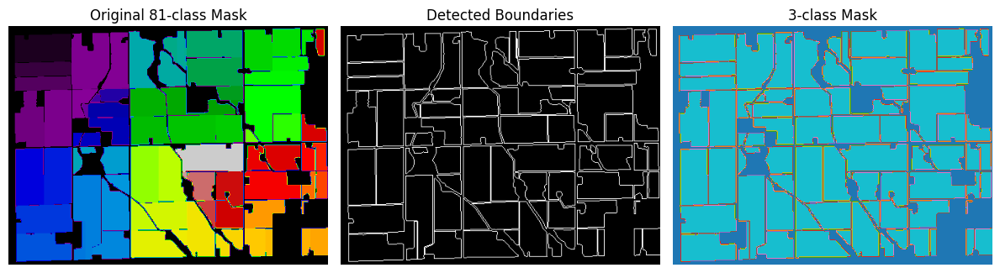

In [ ]:
import rasterio
import numpy as np
from skimage.segmentation import find_boundaries
import matplotlib.pyplot as plt

# Paths
input_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\output\field_boundary_mask_multiclass.tif"
output_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\output\field_boundary_mask_3class.tif"

# Step 1: Load multi-class mask
with rasterio.open(input_path) as src:
    multiclass_mask = src.read(1)
    profile = src.profile.copy()

# Step 2: Detect boundaries (between field IDs)
boundaries = find_boundaries(multiclass_mask, mode='inner').astype(np.uint8)

# Step 3: Create 3-class mask
# Class 0 = Background (0)
# Class 1 = Boundary (where boundary detected)
# Class 2 = Interior (non-zero and not boundary)
mask_3class = np.zeros_like(multiclass_mask, dtype=np.uint8)
mask_3class[(multiclass_mask > 0) & (boundaries == 1)] = 1
mask_3class[(multiclass_mask > 0) & (boundaries == 0)] = 2

# Step 4: Save 3-class mask
profile.update({
    'dtype': 'uint8',
    'count': 1,
    'nodata': 0
})

with rasterio.open(output_path, "w", **profile) as dst:
    dst.write(mask_3class, 1)

print("✅ 3-class mask saved at:", output_path)

# Optional: Visual check
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(multiclass_mask, cmap='nipy_spectral')
plt.title("Original 81-class Mask")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(boundaries, cmap='gray')
plt.title("Detected Boundaries")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(mask_3class, cmap='tab10')
plt.title("3-class Mask")
plt.axis("off")

plt.tight_layout()
plt.show()


In [2]:
import os
import numpy as np
import rasterio
from rasterio.windows import Window
from tqdm import tqdm

# --- CONFIGURATION ---
ndvi_stack_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Small_AOI_Ndvi_Multidate_Stack.tif"
mask_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\output\field_boundary_mask_3class.tif"
output_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\output\Patches"

patch_size = 128
stride = 64

image_out_dir = os.path.join(output_dir, "images")
mask_out_dir = os.path.join(output_dir, "masks")
os.makedirs(image_out_dir, exist_ok=True)
os.makedirs(mask_out_dir, exist_ok=True)

# --- Load NDVI and Mask ---
with rasterio.open(ndvi_stack_path) as ndvi_src, rasterio.open(mask_path) as mask_src:
    width, height = ndvi_src.width, ndvi_src.height
    assert ndvi_src.width == mask_src.width and ndvi_src.height == mask_src.height, "Mismatch in raster sizes!"
    num_bands = ndvi_src.count

    patch_count = 0

    for y in tqdm(range(0, height - patch_size + 1, stride)):
        for x in range(0, width - patch_size + 1, stride):
            window = Window(x, y, patch_size, patch_size)

            # Read NDVI patch
            ndvi_patch = ndvi_src.read(window=window)
            # Read corresponding mask patch
            mask_patch = mask_src.read(1, window=window)

            # Skip patches with only background class (optional)
            if np.unique(mask_patch).tolist() == [0]:
                continue

            # Save patches
            patch_id = f"{y}_{x}"
            np.save(os.path.join(image_out_dir, f"{patch_id}.npy"), ndvi_patch)
            np.save(os.path.join(mask_out_dir, f"{patch_id}.npy"), mask_patch)
            patch_count += 1

print(f"✅ {patch_count} patches extracted and saved to: {output_dir}")


100%|██████████| 4/4 [00:00<00:00, 121.61it/s]

✅ 24 patches extracted and saved to: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\output\Patches


In [77]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import classification_report
from tqdm import tqdm

# --- Dataset Class ---
class FieldSegmentationDataset(Dataset):
    def __init__(self, image_dir, mask_dir):
        self.image_paths = sorted([os.path.join(image_dir, f) for f in os.listdir(image_dir)])
        self.mask_paths = sorted([os.path.join(mask_dir, f) for f in os.listdir(mask_dir)])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img = np.load(self.image_paths[idx])
        mask = np.load(self.mask_paths[idx])
        return torch.tensor(img, dtype=torch.float32), torch.tensor(mask, dtype=torch.long)

# --- U-Net Model (Same as before) ---
class UNet(nn.Module):
    def __init__(self, in_channels, n_classes):
        super(UNet, self).__init__()
        def conv_block(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, kernel_size=3, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_c, out_c, kernel_size=3, padding=1),
                nn.ReLU(inplace=True)
            )
        self.encoder = nn.Sequential(
            conv_block(in_channels, 64),
            nn.MaxPool2d(2),
            conv_block(64, 128),
            nn.MaxPool2d(2),
        )
        self.middle = conv_block(128, 256)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),
            conv_block(128, 64),
            nn.ConvTranspose2d(64, 64, kernel_size=2, stride=2),
            nn.Conv2d(64, n_classes, kernel_size=1)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.middle(x)
        x = self.decoder(x)
        return x

# --- Dice + CrossEntropy Hybrid Loss ---
class DiceCELoss(nn.Module):
    def __init__(self, weight=None, smooth=1e-5):
        super(DiceCELoss, self).__init__()
        self.ce = nn.CrossEntropyLoss(weight=weight)
        self.smooth = smooth

    def forward(self, inputs, targets):
        ce_loss = self.ce(inputs, targets)

        probs = torch.softmax(inputs, dim=1)  # shape: (B, C, H, W)
        targets_one_hot = nn.functional.one_hot(targets, num_classes=inputs.shape[1]).permute(0, 3, 1, 2).float()

        intersection = torch.sum(probs * targets_one_hot, dim=(0, 2, 3))
        union = torch.sum(probs + targets_one_hot, dim=(0, 2, 3))
        dice_score = (2. * intersection + self.smooth) / (union + self.smooth)
        dice_loss = 1 - dice_score.mean()

        return ce_loss + dice_loss

In [78]:
# --- Training Loop ---
def train_model(image_dir, mask_dir, model_path="unet_3class_dice_ce.pth", epochs=30, batch_size=4):
    dataset = FieldSegmentationDataset(image_dir, mask_dir)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    in_channels = 5
    n_classes = 3
    model = UNet(in_channels, n_classes).to(device)

    weights = torch.tensor([1.0, 3.0, 1.0], dtype=torch.float32).to(device)  # Boundary emphasis
    criterion = DiceCELoss(weight=weights)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

    for epoch in range(epochs):
        model.train()
        total_loss = 0.0
        for images, masks in tqdm(dataloader):
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()

        print(f"✅ Epoch {epoch+1}/{epochs} - Loss: {total_loss / len(dataloader):.4f}")

    torch.save(model.state_dict(), model_path)
    print(f"📦 Model saved to {model_path}")

# --- Run Training ---
train_model(
    image_dir=r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\output\Patches\images\filtered",
    mask_dir=r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\output\Patches\masks\filtered"
)


100%|██████████| 6/6 [00:00<00:00, 56.00it/s]


✅ Epoch 1/30 - Loss: 1.7880


100%|██████████| 6/6 [00:00<00:00, 84.40it/s]


✅ Epoch 2/30 - Loss: 1.7831


100%|██████████| 6/6 [00:00<00:00, 86.80it/s]


✅ Epoch 3/30 - Loss: 1.7704


100%|██████████| 6/6 [00:00<00:00, 87.10it/s]


✅ Epoch 4/30 - Loss: 1.7061


100%|██████████| 6/6 [00:00<00:00, 88.11it/s]


✅ Epoch 5/30 - Loss: 1.6433


100%|██████████| 6/6 [00:00<00:00, 88.40it/s]


✅ Epoch 6/30 - Loss: 1.6215


100%|██████████| 6/6 [00:00<00:00, 87.13it/s]


✅ Epoch 7/30 - Loss: 1.6167


100%|██████████| 6/6 [00:00<00:00, 85.84it/s]


✅ Epoch 8/30 - Loss: 1.6164


100%|██████████| 6/6 [00:00<00:00, 85.42it/s]


✅ Epoch 9/30 - Loss: 1.6089


100%|██████████| 6/6 [00:00<00:00, 87.67it/s]


✅ Epoch 10/30 - Loss: 1.6025


100%|██████████| 6/6 [00:00<00:00, 86.46it/s]


✅ Epoch 11/30 - Loss: 1.5980


100%|██████████| 6/6 [00:00<00:00, 88.02it/s]


✅ Epoch 12/30 - Loss: 1.5938


100%|██████████| 6/6 [00:00<00:00, 91.20it/s]


✅ Epoch 13/30 - Loss: 1.5878


100%|██████████| 6/6 [00:00<00:00, 90.19it/s]


✅ Epoch 14/30 - Loss: 1.5789


100%|██████████| 6/6 [00:00<00:00, 87.95it/s]


✅ Epoch 15/30 - Loss: 1.5678


100%|██████████| 6/6 [00:00<00:00, 90.22it/s]


✅ Epoch 16/30 - Loss: 1.5525


100%|██████████| 6/6 [00:00<00:00, 86.76it/s]


✅ Epoch 17/30 - Loss: 1.5283


100%|██████████| 6/6 [00:00<00:00, 89.77it/s]


✅ Epoch 18/30 - Loss: 1.5008


100%|██████████| 6/6 [00:00<00:00, 89.41it/s]


✅ Epoch 19/30 - Loss: 1.4650


100%|██████████| 6/6 [00:00<00:00, 86.02it/s]


✅ Epoch 20/30 - Loss: 1.4404


100%|██████████| 6/6 [00:00<00:00, 90.67it/s]


✅ Epoch 21/30 - Loss: 1.4131


100%|██████████| 6/6 [00:00<00:00, 88.74it/s]


✅ Epoch 22/30 - Loss: 1.3905


100%|██████████| 6/6 [00:00<00:00, 89.20it/s]


✅ Epoch 23/30 - Loss: 1.3641


100%|██████████| 6/6 [00:00<00:00, 88.44it/s]


✅ Epoch 24/30 - Loss: 1.3640


100%|██████████| 6/6 [00:00<00:00, 88.25it/s]


✅ Epoch 25/30 - Loss: 1.3599


100%|██████████| 6/6 [00:00<00:00, 86.01it/s]


✅ Epoch 26/30 - Loss: 1.3303


100%|██████████| 6/6 [00:00<00:00, 87.17it/s]


✅ Epoch 27/30 - Loss: 1.2720


100%|██████████| 6/6 [00:00<00:00, 88.47it/s]


✅ Epoch 28/30 - Loss: 1.2258


100%|██████████| 6/6 [00:00<00:00, 87.19it/s]


✅ Epoch 29/30 - Loss: 1.1932


100%|██████████| 6/6 [00:00<00:00, 89.60it/s]

✅ Epoch 30/30 - Loss: 1.1766
📦 Model saved to unet_3class_dice_ce.pth


In [80]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import classification_report, confusion_matrix
from tqdm import tqdm

# Dataset class
class FieldSegmentationDataset(Dataset):
    def __init__(self, image_dir, mask_dir):
        self.image_paths = sorted([os.path.join(image_dir, f) for f in os.listdir(image_dir)])
        self.mask_paths = sorted([os.path.join(mask_dir, f) for f in os.listdir(mask_dir)])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img = np.load(self.image_paths[idx])
        mask = np.load(self.mask_paths[idx])
        return torch.tensor(img, dtype=torch.float32), torch.tensor(mask, dtype=torch.long)

# UNet model (same as during training)
class UNet(nn.Module):
    def __init__(self, in_channels, n_classes):
        super(UNet, self).__init__()
        def conv_block(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, kernel_size=3, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_c, out_c, kernel_size=3, padding=1),
                nn.ReLU(inplace=True)
            )
        self.encoder = nn.Sequential(
            conv_block(in_channels, 64),
            nn.MaxPool2d(2),
            conv_block(64, 128),
            nn.MaxPool2d(2),
        )
        self.middle = conv_block(128, 256)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),
            conv_block(128, 64),
            nn.ConvTranspose2d(64, 64, kernel_size=2, stride=2),
            nn.Conv2d(64, n_classes, kernel_size=1)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.middle(x)
        x = self.decoder(x)
        return x

# Paths
image_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\output\Patches\images\filtered"
mask_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\output\Patches\masks\filtered"
model_path = "unet_3class_dice_ce.pth"

# Output directory for saving predicted masks
pred_save_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\output\Patches\predicted_outputs"
os.makedirs(pred_save_dir, exist_ok=True)

# Setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
dataset = FieldSegmentationDataset(image_dir, mask_dir)
dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

# Load model
in_channels = 5
n_classes = 3
model = UNet(in_channels, n_classes).to(device)
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()

# Inference + Evaluation
y_true_all = []
y_pred_all = []

for idx, (img, true_mask) in enumerate(tqdm(dataloader)):
    img = img.to(device)
    with torch.no_grad():
        output = model(img)
        pred_mask = torch.argmax(output, dim=1).cpu().numpy()[0]
    
    # Flatten and store
    y_true_all.extend(true_mask.numpy().flatten())
    y_pred_all.extend(pred_mask.flatten())

    # Save the predicted mask
    np.save(os.path.join(pred_save_dir, f"pred_{idx:03}.npy"), pred_mask)

print("\n📊 Classification Report:")
report = classification_report(y_true_all, y_pred_all, output_dict=True, target_names=["Background", "Boundary", "Field"])
print(classification_report(y_true_all, y_pred_all, target_names=["Background", "Boundary", "Field"]))

print("🔢 Confusion Matrix:")
cm = confusion_matrix(y_true_all, y_pred_all)
print(cm)

# If needed elsewhere
result_tuple = (report, cm)


100%|██████████| 24/24 [00:00<00:00, 95.13it/s]



📊 Classification Report:
              precision    recall  f1-score   support

  Background       0.70      0.71      0.70     75467
    Boundary       0.33      0.02      0.04     33742
       Field       0.85      0.95      0.90    284007

    accuracy                           0.82    393216
   macro avg       0.63      0.56      0.55    393216
weighted avg       0.78      0.82      0.79    393216

🔢 Confusion Matrix:
[[ 53212    623  21632]
 [  8080    681  24981]
 [ 14640    746 268621]]


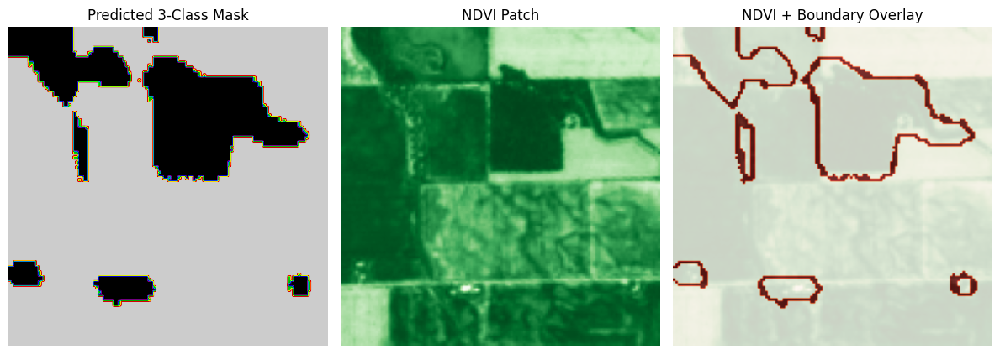

In [86]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import find_boundaries

# --- CONFIG ---
pred_mask_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\output\Patches\predicted_outputs"
image_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\output\Patches\images\filtered"

# List all files
pred_files = sorted([f for f in os.listdir(pred_mask_dir) if f.endswith(".npy")])
image_files = sorted([f for f in os.listdir(image_dir) if f.endswith(".npy")])

# 🔍 Pick an index
idx = 20  # change this to see another patch

# Match prediction and image
pred_path = os.path.join(pred_mask_dir, pred_files[idx])
image_path = os.path.join(image_dir, image_files[idx])

# --- Load predicted mask and NDVI image ---
mask = np.load(pred_path)
ndvi_img = np.load(image_path)

# --- Extract boundary pixels ---
boundary = find_boundaries(mask, mode='outer')

# --- Plotting ---
plt.figure(figsize=(12, 5))

# 1. Predicted mask
plt.subplot(1, 3, 1)
plt.imshow(mask, cmap='nipy_spectral')
plt.title("Predicted 3-Class Mask")
plt.axis("off")

# 2. NDVI Patch
plt.subplot(1, 3, 2)
ndvi_vis = ndvi_img[4]  # NDVI channel
plt.imshow(ndvi_vis, cmap='Greens')
plt.title("NDVI Patch")
plt.axis("off")

# 3. Overlay contours on NDVI
plt.subplot(1, 3, 3)
plt.imshow(ndvi_vis, cmap='Greens')
plt.imshow(boundary, cmap='Reds', alpha=0.8)
plt.title("NDVI + Boundary Overlay")
plt.axis("off")

plt.tight_layout()
plt.show()


In [75]:
import os
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader

# Dataset class
class PatchDataset(Dataset):
    def __init__(self, image_dir, mask_dir):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.image_files = sorted(os.listdir(image_dir))
        self.mask_files = sorted(os.listdir(mask_dir))

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image = np.load(os.path.join(self.image_dir, self.image_files[idx]))
        mask = np.load(os.path.join(self.mask_dir, self.mask_files[idx]))
        return torch.tensor(image, dtype=torch.float32), torch.tensor(mask, dtype=torch.long)

# U-net Model
class UNet(nn.Module):
    def __init__(self, in_channels, n_classes):
        super(UNet, self).__init__()

        def conv_block(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, kernel_size=3, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_c, out_c, kernel_size=3, padding=1),
                nn.ReLU(inplace=True)
            )

        self.encoder = nn.Sequential(
            conv_block(in_channels, 64),      # encoder[0]
            nn.MaxPool2d(2),                  # encoder[1]
            conv_block(64, 128),              # encoder[2]
            nn.MaxPool2d(2),                  # encoder[3]
        )

        self.middle = conv_block(128, 256)

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),  # decoder[0]
            conv_block(128, 64),                                    # decoder[1]
            nn.ConvTranspose2d(64, 64, kernel_size=2, stride=2),    # decoder[2]
            nn.Conv2d(64, n_classes, kernel_size=1)                 # decoder[3]
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.middle(x)
        x = self.decoder(x)
        return x

In [63]:
# Paths
image_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\output\Patches\images"
mask_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\output\Patches\masks"
model_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Project_Code\unet_3class.pth"

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("🔥 Using device:", device)


🔥 Using device: cuda


In [64]:
# Load data
sample_patch = np.load(os.path.join(image_dir, sorted(os.listdir(image_dir))[0]))
in_channels = sample_patch.shape[0]

dataset = PatchDataset(image_dir, mask_dir)
dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load model
model = UNet(in_channels=5, n_classes=3).to(device)
model.load_state_dict(torch.load("unet_3class.pth", map_location=device))
model.eval()

print("✅ Model loaded successfully and ready for inference!")




✅ Model loaded successfully and ready for inference!


In [65]:
# Inference loop
predictions, ground_truths, inputs = [], [], []

with torch.no_grad():
    for i, (image, mask) in enumerate(dataloader):
        image = image.to(device)
        output = model(image)
        pred_mask = torch.argmax(output, dim=1).squeeze().cpu().numpy()

        predictions.append(pred_mask)
        ground_truths.append(mask.squeeze().numpy())
        inputs.append(image.squeeze().cpu().numpy())

        if i == 5:
            break



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.048231512..0.9312223].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.34224048..0.927377].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.048231512..0.9419032].


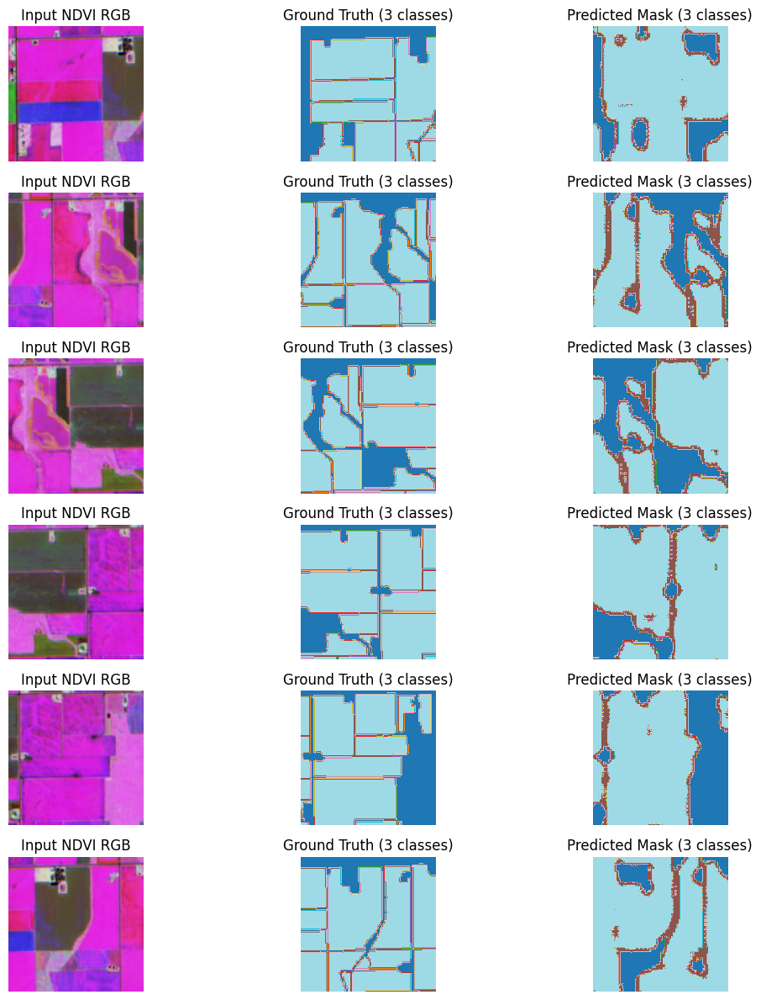

In [66]:
# Visualization
fig, axs = plt.subplots(6, 3, figsize=(12, 12))

for i in range(6):
    axs[i, 0].imshow(np.moveaxis(inputs[i][:3], 0, -1))
    axs[i, 0].set_title("Input NDVI RGB")
    axs[i, 0].axis("off")

    axs[i, 1].imshow(ground_truths[i], cmap="tab20")
    axs[i, 1].set_title("Ground Truth (3 classes)")
    axs[i, 1].axis("off")

    axs[i, 2].imshow(predictions[i], cmap="tab20")
    axs[i, 2].set_title("Predicted Mask (3 classes)")
    axs[i, 2].axis("off")

plt.tight_layout()
plt.show()

In [67]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Evaluation
all_preds, all_gts = [], []
with torch.no_grad():
    for img, mask in dataloader:
        img, mask = img.to(device), mask.to(device)
        output = model(img)
        pred = torch.argmax(output, dim=1)

        all_preds.extend(pred.view(-1).cpu().numpy())
        all_gts.extend(mask.view(-1).cpu().numpy())

# Metrics
report = classification_report(all_gts, all_preds, output_dict=True)
conf_matrix = confusion_matrix(all_gts, all_preds)

report, conf_matrix

({'0': {'precision': 0.7388064316635745,
   'recall': 0.6332039169438297,
   'f1-score': 0.6819411046972108,
   'support': 75467.0},
  '1': {'precision': 0.2471993457215132,
   'recall': 0.38518760002370933,
   'f1-score': 0.301138799105643,
   'support': 33742.0},
  '2': {'precision': 0.903623364340355,
   'recall': 0.8780170911280356,
   'f1-score': 0.8906362171989014,
   'support': 284007.0},
  'accuracy': 0.7887420654296875,
  'macro avg': {'precision': 0.6298763805751476,
   'recall': 0.6321362026985249,
   'f1-score': 0.6245720403339184,
   'support': 393216.0},
  'weighted avg': {'precision': 0.8156633151700374,
   'recall': 0.7887420654296875,
   'f1-score': 0.7999979523865138,
   'support': 393216.0}},
 array([[ 47786,  16098,  11583],
        [  5732,  12997,  15013],
        [ 11162,  23482, 249363]], dtype=int64))

### Filtering patches with good Class 1 coverage

In [68]:
import os
import numpy as np
from tqdm import tqdm
import shutil

# === CONFIGURATION ===
mask_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\output\Patches\masks"
image_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\output\Patches\images"

# Set a threshold (e.g., keep patches with >5% boundary pixels)
boundary_threshold = 0.05

# Optional: filtered patch output directory
filtered_mask_dir = os.path.join(mask_dir, "filtered")
filtered_image_dir = os.path.join(image_dir, "filtered")
os.makedirs(filtered_mask_dir, exist_ok=True)
os.makedirs(filtered_image_dir, exist_ok=True)

boundary_rich_count = 0
total_patches = 0

for fname in tqdm(sorted(os.listdir(mask_dir))):
    if not fname.endswith(".npy"):
        continue

    mask_path = os.path.join(mask_dir, fname)
    image_path = os.path.join(image_dir, fname)  # Same name assumed

    mask = np.load(mask_path)
    total_pixels = mask.size
    boundary_pixels = np.sum(mask == 1)

    boundary_ratio = boundary_pixels / total_pixels

    if boundary_ratio >= boundary_threshold:
        # Save to filtered folder (optional)
        shutil.copy(mask_path, os.path.join(filtered_mask_dir, fname))
        shutil.copy(image_path, os.path.join(filtered_image_dir, fname))
        boundary_rich_count += 1

print(f"\n✅ Total patches: {total_patches}")
print(f"✅ Boundary-rich patches selected: {boundary_rich_count}")
print(f"📂 Filtered patches saved in: {filtered_mask_dir} and {filtered_image_dir}")


100%|██████████| 25/25 [00:00<00:00, 828.51it/s]


✅ Total patches: 0
✅ Boundary-rich patches selected: 24
📂 Filtered patches saved in: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\output\Patches\masks\filtered and C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\output\Patches\images\filtered


## Back to Binary Segmentation

In [4]:
import os
import rasterio
import geopandas as gpd
from rasterio.features import rasterize

# --- CONFIG ---
vector_path = r"C:\Users\gagan\OneDrive\Desktop\clipped_geopro.shp"
reference_raster_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Small_AOI_Ndvi_Multidate_Stack.tif"
output_mask_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_binary_mask.tif"

# --- Load vector data (ensure valid geometries only)
gdf = gpd.read_file(vector_path)
gdf = gdf[~gdf.geometry.is_empty & gdf.geometry.is_valid]

# --- Load reference raster metadata
with rasterio.open(reference_raster_path) as src:
    ref_meta = src.meta.copy()
    ref_shape = (src.height, src.width)
    ref_transform = src.transform
    ref_crs = src.crs

# --- Reproject shapefile to match raster CRS
gdf = gdf.to_crs(ref_crs)

# --- Rasterize shapefile: field = 1, background = 0
binary_mask = rasterize(
    [(geom, 1) for geom in gdf.geometry],
    out_shape=ref_shape,
    transform=ref_transform,
    fill=0,
    dtype='uint8'
)

# --- Update metadata
ref_meta.update({
    "count": 1,
    "dtype": "uint8",
    "nodata": 0
})

# --- Save binary mask as GeoTIFF
with rasterio.open(output_mask_path, "w", **ref_meta) as dst:
    dst.write(binary_mask, 1)

print(f"✅ Binary mask saved to: {output_mask_path}")

✅ Binary mask saved to: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_binary_mask.tif


In [5]:
import os
import numpy as np
import rasterio
from rasterio.windows import Window
from tqdm import tqdm

# --- CONFIGURATION ---
ndvi_stack_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Small_AOI_Ndvi_Multidate_Stack.tif"
mask_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_binary_mask.tif"
output_dir = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\Patches_binary"

patch_size = 128
stride = 64

image_out_dir = os.path.join(output_dir, "images")
mask_out_dir = os.path.join(output_dir, "masks")
os.makedirs(image_out_dir, exist_ok=True)
os.makedirs(mask_out_dir, exist_ok=True)

# --- Load NDVI and Mask ---
with rasterio.open(ndvi_stack_path) as ndvi_src, rasterio.open(mask_path) as mask_src:
    width, height = ndvi_src.width, ndvi_src.height
    assert ndvi_src.width == mask_src.width and ndvi_src.height == mask_src.height, "Mismatch in raster sizes!"
    num_bands = ndvi_src.count

    patch_count = 0

    for y in tqdm(range(0, height - patch_size + 1, stride)):
        for x in range(0, width - patch_size + 1, stride):
            window = Window(x, y, patch_size, patch_size)

            # Read NDVI patch (multi-band)
            ndvi_patch = ndvi_src.read(window=window)

            # Read corresponding mask patch
            mask_patch = mask_src.read(1, window=window)

            # Optional: skip all-background patches
            if np.unique(mask_patch).tolist() == [0]:
                continue

            # Save .npy patches
            patch_id = f"{y}_{x}"
            np.save(os.path.join(image_out_dir, f"{patch_id}.npy"), ndvi_patch)
            np.save(os.path.join(mask_out_dir, f"{patch_id}.npy"), mask_patch)

            patch_count += 1

print(f"✅ {patch_count} patches saved to {output_dir}")


100%|██████████| 4/4 [00:00<00:00, 114.19it/s]

✅ 24 patches saved to C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\Patches_binary


In [17]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
import torch.nn.functional as F

# --- Dataset Class ---
class BinaryFieldDataset(Dataset):
    def __init__(self, image_dir, mask_dir):
        self.image_paths = sorted([os.path.join(image_dir, f) for f in os.listdir(image_dir)])
        self.mask_paths = sorted([os.path.join(mask_dir, f) for f in os.listdir(mask_dir)])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img = np.load(self.image_paths[idx])          # shape: (Bands, H, W)
        mask = np.load(self.mask_paths[idx])          # shape: (H, W)
        return torch.tensor(img, dtype=torch.float32), torch.tensor(mask, dtype=torch.float32).unsqueeze(0)

# --- Dice Loss ---
def dice_loss(pred, target, smooth=1e-5):
    pred = torch.sigmoid(pred)
    intersection = (pred * target).sum(dim=(1, 2, 3))
    union = pred.sum(dim=(1, 2, 3)) + target.sum(dim=(1, 2, 3))
    dice = 1 - ((2 * intersection + smooth) / (union + smooth))
    return dice.mean()

# --- U-Net Architecture ---
class UNet(nn.Module):
    def __init__(self, in_channels):
        super(UNet, self).__init__()
        def conv_block(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, kernel_size=3, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_c, out_c, kernel_size=3, padding=1),
                nn.ReLU(inplace=True),
            )
        self.enc1 = conv_block(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = conv_block(64, 128)
        self.pool2 = nn.MaxPool2d(2)

        self.bottleneck = conv_block(128, 256)

        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = conv_block(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = conv_block(128, 64)

        self.final = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool1(e1))
        b = self.bottleneck(self.pool2(e2))
        d2 = self.dec2(torch.cat([self.up2(b), e2], dim=1))
        d1 = self.dec1(torch.cat([self.up1(d2), e1], dim=1))
        return self.final(d1)

# --- Training Function ---
def train_binary_unet(
    image_dir,
    mask_dir,
    model_path="unet_binary.pth",
    epochs=30,
    batch_size=4,
    use_dice=True
):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    dataset = BinaryFieldDataset(image_dir, mask_dir)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

    in_channels = np.load(dataset.image_paths[0]).shape[0]
    model = UNet(in_channels).to(device)

    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    bce = nn.BCEWithLogitsLoss()

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        for images, masks in tqdm(dataloader, desc=f"Epoch {epoch+1}/{epochs}"):
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = bce(outputs, masks)
            if use_dice:
                loss += dice_loss(outputs, masks)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
        print(f"✅ Epoch {epoch+1} - Loss: {running_loss / len(dataloader):.4f}")

    torch.save(model.state_dict(), model_path)
    print(f"📦 Model saved to {model_path}")


In [18]:
train_binary_unet(
    image_dir=r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\Patches_binary\images",
    mask_dir=r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\Patches_binary\masks",
    model_path="unet_binary.pth",
    epochs=50,
    batch_size=4,
    use_dice=True  # Set to False to disable Dice Loss
)


Epoch 1/50: 100%|██████████| 6/6 [00:00<00:00, 51.01it/s]


✅ Epoch 1 - Loss: 1.1220


Epoch 2/50: 100%|██████████| 6/6 [00:00<00:00, 54.09it/s]


✅ Epoch 2 - Loss: 1.0957


Epoch 3/50: 100%|██████████| 6/6 [00:00<00:00, 55.39it/s]


✅ Epoch 3 - Loss: 1.0517


Epoch 4/50: 100%|██████████| 6/6 [00:00<00:00, 55.36it/s]


✅ Epoch 4 - Loss: 0.9479


Epoch 5/50: 100%|██████████| 6/6 [00:00<00:00, 55.28it/s]


✅ Epoch 5 - Loss: 0.7621


Epoch 6/50: 100%|██████████| 6/6 [00:00<00:00, 55.46it/s]


✅ Epoch 6 - Loss: 0.7167


Epoch 7/50: 100%|██████████| 6/6 [00:00<00:00, 54.19it/s]


✅ Epoch 7 - Loss: 0.7038


Epoch 8/50: 100%|██████████| 6/6 [00:00<00:00, 54.30it/s]


✅ Epoch 8 - Loss: 0.6874


Epoch 9/50: 100%|██████████| 6/6 [00:00<00:00, 53.98it/s]


✅ Epoch 9 - Loss: 0.6806


Epoch 10/50: 100%|██████████| 6/6 [00:00<00:00, 56.75it/s]


✅ Epoch 10 - Loss: 0.6725


Epoch 11/50: 100%|██████████| 6/6 [00:00<00:00, 54.64it/s]


✅ Epoch 11 - Loss: 0.6618


Epoch 12/50: 100%|██████████| 6/6 [00:00<00:00, 54.93it/s]


✅ Epoch 12 - Loss: 0.6505


Epoch 13/50: 100%|██████████| 6/6 [00:00<00:00, 54.85it/s]


✅ Epoch 13 - Loss: 0.6330


Epoch 14/50: 100%|██████████| 6/6 [00:00<00:00, 54.88it/s]


✅ Epoch 14 - Loss: 0.6174


Epoch 15/50: 100%|██████████| 6/6 [00:00<00:00, 54.65it/s]


✅ Epoch 15 - Loss: 0.5984


Epoch 16/50: 100%|██████████| 6/6 [00:00<00:00, 55.49it/s]


✅ Epoch 16 - Loss: 0.5731


Epoch 17/50: 100%|██████████| 6/6 [00:00<00:00, 54.33it/s]


✅ Epoch 17 - Loss: 0.5457


Epoch 18/50: 100%|██████████| 6/6 [00:00<00:00, 54.67it/s]


✅ Epoch 18 - Loss: 0.5214


Epoch 19/50: 100%|██████████| 6/6 [00:00<00:00, 54.04it/s]


✅ Epoch 19 - Loss: 0.4982


Epoch 20/50: 100%|██████████| 6/6 [00:00<00:00, 54.44it/s]


✅ Epoch 20 - Loss: 0.4770


Epoch 21/50: 100%|██████████| 6/6 [00:00<00:00, 54.93it/s]


✅ Epoch 21 - Loss: 0.4567


Epoch 22/50: 100%|██████████| 6/6 [00:00<00:00, 55.21it/s]


✅ Epoch 22 - Loss: 0.4402


Epoch 23/50: 100%|██████████| 6/6 [00:00<00:00, 53.63it/s]


✅ Epoch 23 - Loss: 0.4225


Epoch 24/50: 100%|██████████| 6/6 [00:00<00:00, 54.99it/s]


✅ Epoch 24 - Loss: 0.4254


Epoch 25/50: 100%|██████████| 6/6 [00:00<00:00, 55.01it/s]


✅ Epoch 25 - Loss: 0.4051


Epoch 26/50: 100%|██████████| 6/6 [00:00<00:00, 55.52it/s]


✅ Epoch 26 - Loss: 0.3928


Epoch 27/50: 100%|██████████| 6/6 [00:00<00:00, 55.62it/s]


✅ Epoch 27 - Loss: 0.3800


Epoch 28/50: 100%|██████████| 6/6 [00:00<00:00, 56.20it/s]


✅ Epoch 28 - Loss: 0.3843


Epoch 29/50: 100%|██████████| 6/6 [00:00<00:00, 55.66it/s]


✅ Epoch 29 - Loss: 0.3700


Epoch 30/50: 100%|██████████| 6/6 [00:00<00:00, 56.13it/s]


✅ Epoch 30 - Loss: 0.3567


Epoch 31/50: 100%|██████████| 6/6 [00:00<00:00, 54.59it/s]


✅ Epoch 31 - Loss: 0.3521


Epoch 32/50: 100%|██████████| 6/6 [00:00<00:00, 55.47it/s]


✅ Epoch 32 - Loss: 0.3411


Epoch 33/50: 100%|██████████| 6/6 [00:00<00:00, 56.53it/s]


✅ Epoch 33 - Loss: 0.3274


Epoch 34/50: 100%|██████████| 6/6 [00:00<00:00, 56.00it/s]


✅ Epoch 34 - Loss: 0.3241


Epoch 35/50: 100%|██████████| 6/6 [00:00<00:00, 55.99it/s]


✅ Epoch 35 - Loss: 0.3156


Epoch 36/50: 100%|██████████| 6/6 [00:00<00:00, 54.78it/s]


✅ Epoch 36 - Loss: 0.3035


Epoch 37/50: 100%|██████████| 6/6 [00:00<00:00, 56.22it/s]


✅ Epoch 37 - Loss: 0.2979


Epoch 38/50: 100%|██████████| 6/6 [00:00<00:00, 56.38it/s]


✅ Epoch 38 - Loss: 0.2933


Epoch 39/50: 100%|██████████| 6/6 [00:00<00:00, 56.10it/s]


✅ Epoch 39 - Loss: 0.2831


Epoch 40/50: 100%|██████████| 6/6 [00:00<00:00, 54.73it/s]


✅ Epoch 40 - Loss: 0.2770


Epoch 41/50: 100%|██████████| 6/6 [00:00<00:00, 54.29it/s]


✅ Epoch 41 - Loss: 0.2783


Epoch 42/50: 100%|██████████| 6/6 [00:00<00:00, 55.02it/s]


✅ Epoch 42 - Loss: 0.2751


Epoch 43/50: 100%|██████████| 6/6 [00:00<00:00, 55.10it/s]


✅ Epoch 43 - Loss: 0.2618


Epoch 44/50: 100%|██████████| 6/6 [00:00<00:00, 54.49it/s]


✅ Epoch 44 - Loss: 0.2632


Epoch 45/50: 100%|██████████| 6/6 [00:00<00:00, 54.81it/s]


✅ Epoch 45 - Loss: 0.2621


Epoch 46/50: 100%|██████████| 6/6 [00:00<00:00, 56.05it/s]


✅ Epoch 46 - Loss: 0.2564


Epoch 47/50: 100%|██████████| 6/6 [00:00<00:00, 55.50it/s]


✅ Epoch 47 - Loss: 0.2616


Epoch 48/50: 100%|██████████| 6/6 [00:00<00:00, 55.54it/s]


✅ Epoch 48 - Loss: 0.2445


Epoch 49/50: 100%|██████████| 6/6 [00:00<00:00, 55.86it/s]


✅ Epoch 49 - Loss: 0.2397


Epoch 50/50: 100%|██████████| 6/6 [00:00<00:00, 54.91it/s]

✅ Epoch 50 - Loss: 0.2380
📦 Model saved to unet_binary.pth


In [ ]:
import torch
import torch.nn as nn
import numpy as np
import rasterio
import os

# === Define U-Net used during training ===
class UNet(nn.Module):
    def __init__(self, in_channels):
        super(UNet, self).__init__()

        def conv_block(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, kernel_size=3, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_c, out_c, kernel_size=3, padding=1),
                nn.ReLU(inplace=True)
            )

        self.enc1 = conv_block(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2)

        self.enc2 = conv_block(64, 128)
        self.pool2 = nn.MaxPool2d(2)

        self.bottleneck = conv_block(128, 256)

        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = conv_block(256, 128)

        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = conv_block(128, 64)

        self.final = nn.Conv2d(64, 1, kernel_size=1)

    def center_crop(self, enc_feat, target_size):
        _, _, h, w = enc_feat.size()
        th, tw = target_size
        x1 = (h - th) // 2
        y1 = (w - tw) // 2
        return enc_feat[:, :, x1:x1 + th, y1:y1 + tw]

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool1(e1))
        b = self.bottleneck(self.pool2(e2))

        up2 = self.up2(b)
        e2_crop = self.center_crop(e2, up2.shape[2:])
        d2 = self.dec2(torch.cat([up2, e2_crop], dim=1))

        up1 = self.up1(d2)
        e1_crop = self.center_crop(e1, up1.shape[2:])
        d1 = self.dec1(torch.cat([up1, e1_crop], dim=1))

        return self.final(d1)



# --- Paths ---
model_path = "unet_binary.pth"
ndvi_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Small_AOI_Ndvi_Multidate_Stack.tif"
output_mask_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_binary_predicted_mask.tif"


with rasterio.open(ndvi_path) as src:
    ndvi = src.read()  # shape: (C, H, W)
    profile = src.profile
    transform = src.transform
    crs = src.crs

# === Predict ===
input_tensor = torch.tensor(ndvi).unsqueeze(0).float()  # (1, C, H, W)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = UNet(in_channels=input_tensor.shape[1]).to(device)
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()

with torch.no_grad():
    output = model(input_tensor.to(device))
    prob = torch.sigmoid(output).squeeze().cpu().numpy()
    binary_mask = (prob > 0.5).astype(np.uint8)

# === Save predicted binary mask ===
profile.update({"count": 1, "dtype": "uint8", "nodata": 0})
with rasterio.open(output_mask_path, "w", **profile) as dst:
    dst.write(binary_mask, 1)

print("✅ Saved predicted binary mask:", output_mask_path)


✅ Saved predicted binary mask: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_binary_predicted_mask.tif


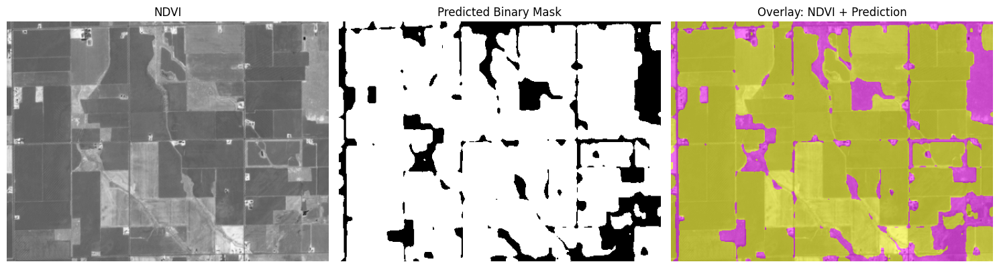

In [28]:
import matplotlib.pyplot as plt
import rasterio
import numpy as np

# Paths
pred_mask_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_binary_predicted_mask.tif"
ndvi_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Small_AOI_Ndvi_Multidate_Stack.tif"

# === Load NDVI (for background image) ===
with rasterio.open(ndvi_path) as ndvi_src:
    
    # ndvi = ndvi_src.read(1) # Show first NDVI date
    ndvi = ndvi_src.read(2) # Show second NDVI date
    # ndvi = ndvi_src.read(3) # Show third NDVI date
    # ndvi = ndvi_src.read(4) # Show fourth NDVI date
    # ndvi = ndvi_src.read(5) # Show fifth NDVI date

    ndvi_profile = ndvi_src.profile

# === Load Predicted Mask ===
with rasterio.open(pred_mask_path) as mask_src:
    pred_mask = mask_src.read(1)

# === Visualize ===
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(ndvi, cmap='gray')
plt.title("NDVI")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(pred_mask, cmap='gray')
plt.title("Predicted Binary Mask")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(ndvi, cmap='gray')
plt.imshow(pred_mask, cmap='spring', alpha=0.5)
plt.title("Overlay: NDVI + Prediction")
plt.axis("off")

plt.tight_layout()
plt.show()


📊 Classification Report:
              precision    recall  f1-score   support

  Background       0.87      0.65      0.75     36703
       Field       0.90      0.97      0.93    113712

    accuracy                           0.89    150415
   macro avg       0.88      0.81      0.84    150415
weighted avg       0.89      0.89      0.89    150415

🔢 Confusion Matrix:
[[ 23896  12807]
 [  3543 110169]]


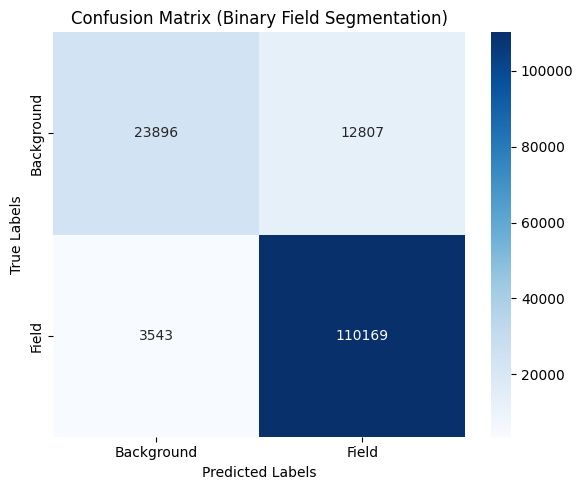

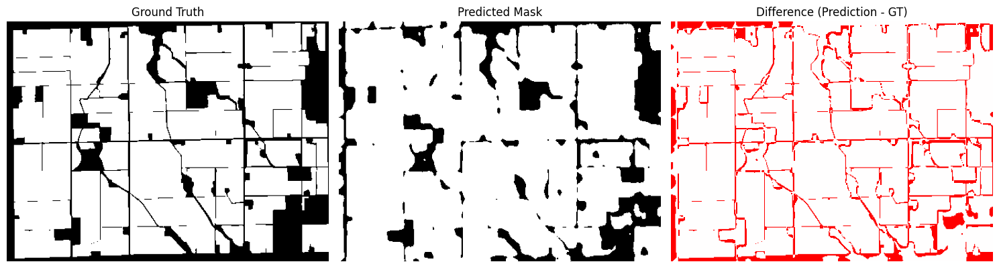

In [41]:
import rasterio
import geopandas as gpd
import numpy as np
import seaborn as sns
from rasterio.features import rasterize
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt

# === Paths ===
pred_mask_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_binary_predicted_mask.tif"
reference_band_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Small_AOI_Ndvi_Multidate_Stack.tif"
shapefile_path = r"C:\Users\gagan\OneDrive\Desktop\clipped_geopro.shp"

# === Step 1: Load predicted mask
with rasterio.open(pred_mask_path) as src:
    pred_mask = src.read(1).astype(np.uint8)
    transform = src.transform
    crs = src.crs
    out_shape = (src.height, src.width)

# === Step 2: Rasterize shapefile to same shape
gdf = gpd.read_file(shapefile_path).to_crs(crs)
ground_truth = rasterize(
    [(geom, 1) for geom in gdf.geometry],
    out_shape=out_shape,
    transform=transform,
    fill=0,
    dtype=np.uint8
)

# === Step 3: Flatten and calculate metrics
y_true = ground_truth.flatten()
y_pred = pred_mask.flatten()

print("📊 Classification Report:")
print(classification_report(y_true, y_pred, target_names=["Background", "Field"]))

cm = confusion_matrix(y_true, y_pred)
print("🔢 Confusion Matrix:")
print(cm)
labels = ['Background', 'Field']

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix (Binary Field Segmentation)')
plt.tight_layout()
plt.show()

# === Step 4: Visual Difference
plt.figure(figsize=(15, 4))

plt.subplot(1, 3, 1)
plt.imshow(ground_truth, cmap='gray')
plt.title("Ground Truth")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(pred_mask, cmap='gray')
plt.title("Predicted Mask")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(pred_mask - ground_truth, cmap='bwr', vmin=-1, vmax=1)
plt.title("Difference (Prediction - GT)")
plt.axis("off")

plt.tight_layout()
plt.show()


In [32]:
import os
import rasterio
import numpy as np
import geopandas as gpd
from skimage import measure
from shapely.geometry import shape
from rasterio.features import shapes
from tqdm import tqdm

# === CONFIG ===
predicted_mask_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_binary_predicted_mask.tif"
output_shapefile_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_boundaries.shp"

# === Load predicted binary mask ===
with rasterio.open(predicted_mask_path) as src:
    mask = src.read(1)
    transform = src.transform
    crs = src.crs

# === Extract shapes from mask ===
print("🔍 Extracting field polygons...")
polygons = []
for geom, value in tqdm(shapes(mask.astype(np.uint8), mask=mask.astype(bool), transform=transform)):
    if value == 1:
        poly = shape(geom)
        if poly.area > 50:  # filter tiny fragments
            polygons.append(poly)

# === Create GeoDataFrame ===
gdf = gpd.GeoDataFrame(geometry=polygons, crs=crs)
gdf["field_id"] = range(1, len(gdf) + 1)

# === Reproject to UTM (meters) to calculate accurate area ===
gdf_utm = gdf.to_crs(epsg=32617)  # Replace with appropriate UTM zone for your AOI
gdf["area_sqm"] = gdf_utm.area
gdf["area_acres"] = gdf["area_sqm"] * 0.000247105  # 1 m² = 0.000247105 acres

# === Save to Shapefile ===
gdf.to_file(output_shapefile_path)
print(f"✅ Field boundaries with area saved to: {output_shapefile_path}")


🔍 Extracting field polygons...


19it [00:00, 2709.50it/s]

✅ Field boundaries with area saved to: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_boundaries.shp


In [33]:
import geopandas as gpd
import rasterio
from rasterio.features import shapes
from shapely.geometry import shape
import numpy as np
import os

# --- Paths ---
mask_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_binary_predicted_mask.tif"
output_vector_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_boundaries_after_prediction\field_boundaries_from_prediction.shp"

# --- Load mask ---
with rasterio.open(mask_path) as src:
    mask = src.read(1)
    transform = src.transform
    crs = src.crs

# --- Extract shapes where mask == 1 (field area) ---
polygons = []
values = []

for geom, value in shapes(mask, mask=(mask == 1), transform=transform):
    polygons.append(shape(geom))
    values.append(value)

# --- Create GeoDataFrame ---
gdf = gpd.GeoDataFrame({"geometry": polygons, "value": values}, crs=crs)

# --- Optional: Filter small polygons (e.g., < 500 m²) ---
gdf["area_m2"] = gdf.geometry.area
gdf = gdf[gdf["area_m2"] > 500].copy()

# --- Save shapefile ---
gdf.to_file(output_vector_path)
print("✅ Field boundaries saved to:", output_vector_path)


✅ Field boundaries saved to: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_boundaries_after_prediction\field_boundaries_from_prediction.shp


In [34]:
import geopandas as gpd

# --- Input/Output ---
input_shapefile = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_boundaries_after_prediction\field_boundaries_from_prediction.shp"
output_shapefile = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_boundaries_after_prediction\Shape_with_Acreage\field_boundaries_with_acreage.shp"

# --- Load shapefile ---
gdf = gpd.read_file(input_shapefile)

# --- Add unique field ID ---
gdf["Field_ID"] = ["Field_" + str(i + 1) for i in range(len(gdf))]

# --- Reproject to UTM (for accurate area calculation) ---
gdf_utm = gdf.to_crs(epsg=32617)  # UTM Zone 17N for Huron County, MI

# --- Compute area in acres ---
gdf_utm["Area_acres"] = gdf_utm.geometry.area / 4046.86

# --- Convert back to original CRS for saving ---
gdf_final = gdf_utm.to_crs(gdf.crs)

# --- Save updated shapefile ---
gdf_final.to_file(output_shapefile)
print("✅ Saved field boundaries with acreage:", output_shapefile)


✅ Saved field boundaries with acreage: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_boundaries_after_prediction\Shape_with_Acreage\field_boundaries_with_acreage.shp


In [36]:
import geopandas as gpd

# === Load ground truth shapefile ===
gdf = gpd.read_file(r"C:\Users\gagan\OneDrive\Desktop\clipped_geopro.shp")

# === Reproject to UTM / Meter-based CRS if not already ===
# EPSG:32617 is UTM zone 17N — change this based on your location
if gdf.crs.is_geographic:
    gdf = gdf.to_crs("EPSG:32617")

# === Calculate area in square meters and convert to acres ===
gdf["area_m2"] = gdf.geometry.area
gdf["area_acres"] = gdf["area_m2"] / 4046.86

# === Save updated shapefile ===
gdf.to_file(r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_boundaries_after_prediction\Ground_Truth_Acreage\clipped_geopro_with_acreage.shp")
print("✅ Saved: clipped_geopro_with_acreage.shp with acreage column")


✅ Saved: clipped_geopro_with_acreage.shp with acreage column


In [38]:
import geopandas as gpd

# === Load predicted and ground truth shapefiles ===
predicted = gpd.read_file(r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_boundaries_after_prediction\Shape_with_Acreage\field_boundaries_with_acreage.shp")  # Replace with your file
ground_truth = gpd.read_file(r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_boundaries_after_prediction\Ground_Truth_Acreage\clipped_geopro_with_acreage.shp")

# === Reproject both to the same CRS (if needed) ===
if predicted.crs != ground_truth.crs:
    predicted = predicted.to_crs(ground_truth.crs)

# === Calculate area for predicted fields ===
predicted["area_m2"] = predicted.geometry.area
predicted["area_acres"] = predicted["area_m2"] / 4046.86

# === Spatial join: match predicted with overlapping ground truth ===
joined = gpd.sjoin(predicted, ground_truth[["geometry", "area_acres"]], how="left", predicate="intersects")

# === Drop entries with no ground truth match (optional) ===
joined = joined.dropna(subset=["area_acres_right"])

# === Compare predicted vs ground truth acres ===
comparison = joined[["area_acres_left", "area_acres_right"]].copy()
comparison.columns = ["predicted_acres", "ground_truth_acres"]
comparison["difference"] = comparison["predicted_acres"] - comparison["ground_truth_acres"]
comparison["percent_error"] = 100 * comparison["difference"].abs() / comparison["ground_truth_acres"]


# === Summary Statistics ===
print("📊 Acreage Comparison Summary:")
print(comparison.describe())

# === Save comparison table ===
comparison.to_csv("acreage_comparison.csv", index=False)
print("✅ Saved: acreage_comparison.csv")


📊 Acreage Comparison Summary:
       predicted_acres  ground_truth_acres   difference  percent_error
count        82.000000           82.000000    82.000000      82.000000
mean       2751.370741           34.409727  2716.961013   21897.251442
std         700.149513           26.115018   694.633353   37088.802478
min           0.543631            1.434163    -8.485876      29.202342
25%        2928.690392           11.789321  2866.385089    4602.351949
50%        2928.690392           29.520277  2892.727999    8043.760168
75%        2928.690392           54.615605  2914.127759   20013.339545
max        2928.690392          104.430359  2927.256229  204109.081825
✅ Saved: acreage_comparison.csv


In [2]:
import rasterio
import geopandas as gpd
import numpy as np
from rasterio.features import shapes
from shapely.geometry import shape
from sklearn.metrics import f1_score, jaccard_score
import pandas as pd

# === CONFIG ===
predicted_mask_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_binary_predicted_mask.tif"
ground_truth_mask_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_binary_mask.tif"
ground_truth_total_acres = 2812.57
output_shapefile = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_boundaries_after_prediction\Acreage_Comparison\New\predicted_fields.shp"

# === Step 1: Read predicted and ground truth masks ===
with rasterio.open(predicted_mask_path) as pred_src, rasterio.open(ground_truth_mask_path) as gt_src:
    pred_mask = pred_src.read(1).astype(np.uint8)
    gt_mask = gt_src.read(1).astype(np.uint8)
    transform = pred_src.transform
    crs = pred_src.crs

# === Step 2: Calculate Dice and IoU ===
flat_pred = pred_mask.flatten()
flat_gt = gt_mask.flatten()

# Filter out background if needed (i.e., nodata), not required unless explicitly defined
valid = (flat_gt >= 0)  # All pixels are valid here
dice_score = f1_score(flat_gt[valid], flat_pred[valid])
iou_score = jaccard_score(flat_gt[valid], flat_pred[valid])

# === Step 3: Polygonize predicted mask (value == 1 is field) ===
polygons = []
for geom, value in shapes(pred_mask, mask=pred_mask == 1, transform=transform):
    if value == 1:
        polygons.append(shape(geom))

# === Step 4: Convert to GeoDataFrame and filter small areas ===
gdf = gpd.GeoDataFrame(geometry=polygons, crs=crs)
gdf["area_m2"] = gdf.geometry.area
gdf = gdf[gdf["area_m2"] > 500]  # keep polygons > 500 m²
gdf["area_acres"] = gdf["area_m2"] / 4046.8564224

# === Step 5: Calculate total predicted acreage ===
total_predicted_acres = gdf["area_acres"].sum()
error = total_predicted_acres - ground_truth_total_acres
percent_error = (error / ground_truth_total_acres) * 100

# === Step 6: Print summary ===
print(f"📏 Ground Truth Acres:   {ground_truth_total_acres:.2f}")
print(f"📐 Predicted Total Acres: {total_predicted_acres:.2f}")
print(f"🔁 Absolute Error:        {error:.2f} acres")
print(f"📊 Percent Error:         {percent_error:.2f}%")

print("\n📊 Segmentation Evaluation:")
print(f"🎯 Dice Coefficient:      {dice_score:.4f}")
print(f"📐 IoU Score:             {iou_score:.4f}")

# === Step 7: Save predicted shapefile ===
gdf.to_file(output_shapefile)
print(f"✅ Saved predicted field polygons to: {output_shapefile}")


📏 Ground Truth Acres:   2812.57
📐 Predicted Total Acres: 3038.68
🔁 Absolute Error:        226.11 acres
📊 Percent Error:         8.04%

📊 Segmentation Evaluation:
🎯 Dice Coefficient:      0.9309
📐 IoU Score:             0.8708
✅ Saved predicted field polygons to: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_boundaries_after_prediction\Acreage_Comparison\New\predicted_fields.shp


In [1]:
import torch
import torch.nn as nn
import numpy as np
import rasterio
from rasterio.transform import from_origin
from rasterio.features import shapes
from shapely.geometry import shape
import geopandas as gpd
import os

# === Step 1: Define U-Net model class ===
class UNet(nn.Module):
    def __init__(self, in_channels):
        super(UNet, self).__init__()

        def conv_block(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, kernel_size=3, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_c, out_c, kernel_size=3, padding=1),
                nn.ReLU(inplace=True)
            )

        self.enc1 = conv_block(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = conv_block(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        self.bottleneck = conv_block(128, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = conv_block(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = conv_block(128, 64)
        self.final = nn.Conv2d(64, 1, kernel_size=1)

    def center_crop(self, enc_feat, target_size):
        _, _, h, w = enc_feat.size()
        th, tw = target_size
        x1 = (h - th) // 2
        y1 = (w - tw) // 2
        return enc_feat[:, :, x1:x1 + th, y1:y1 + tw]

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool1(e1))
        b = self.bottleneck(self.pool2(e2))
        up2 = self.up2(b)
        e2_crop = self.center_crop(e2, up2.shape[2:])
        d2 = self.dec2(torch.cat([up2, e2_crop], dim=1))
        up1 = self.up1(d2)
        e1_crop = self.center_crop(e1, up1.shape[2:])
        d1 = self.dec1(torch.cat([up1, e1_crop], dim=1))
        return self.final(d1)

# === Step 2: Paths and config ===
ndvi_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\AOI_NDVI_multidate_stack.tif"
model_path = r"unet_binary.pth"
predicted_mask_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\Huron_County_Prediction\field_binary_predicted_mask_huron.tif"
shapefile_output = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\Huron_County_Prediction\field_boundaries_huron.shp"

# === Step 3: Read NDVI image ===
with rasterio.open(ndvi_path) as src:
    ndvi = src.read()  # (C, H, W)
    profile = src.profile
    transform = src.transform
    crs = src.crs

# === Step 4: Load Model ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet(in_channels=ndvi.shape[0]).to(device)
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()

# === Step 5: Predict ===
input_tensor = torch.tensor(ndvi).unsqueeze(0).float().to(device)
with torch.no_grad():
    output = model(input_tensor)
    prob = torch.sigmoid(output).squeeze().cpu().numpy()
    binary_mask = (prob > 0.5).astype(np.uint8)

# === Step 6: Save predicted binary mask ===
profile.update(count=1, dtype='uint8', compress='lzw', nodata=0)
with rasterio.open(predicted_mask_path, "w", **profile) as dst:
    dst.write(binary_mask, 1)
print(f"✅ Saved predicted mask to: {predicted_mask_path}")

# === Step 7: Polygonize predicted fields ===
polygons = [shape(geom) for geom, val in shapes(binary_mask, mask=binary_mask == 1, transform=transform) if val == 1]
gdf = gpd.GeoDataFrame(geometry=polygons, crs=crs)
gdf["area_m2"] = gdf.area
gdf = gdf[gdf["area_m2"] > 500]  # Optional: remove noise
gdf["area_acres"] = gdf["area_m2"] / 4046.8564224
gdf.to_file(shapefile_output)
print(f"✅ Saved predicted field boundaries shapefile: {shapefile_output}")


✅ Saved predicted mask to: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\Huron_County_Prediction\field_binary_predicted_mask_huron.tif
✅ Saved predicted field boundaries shapefile: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\Huron_County_Prediction\field_boundaries_huron.shp


c:\Users\gagan\AppData\Local\Programs\Python\Python310\lib\site-packages\matplotlib\image.py:513: RuntimeWarning: overflow encountered in multiply
  A_resampled *= ((a_max - a_min) / frac)


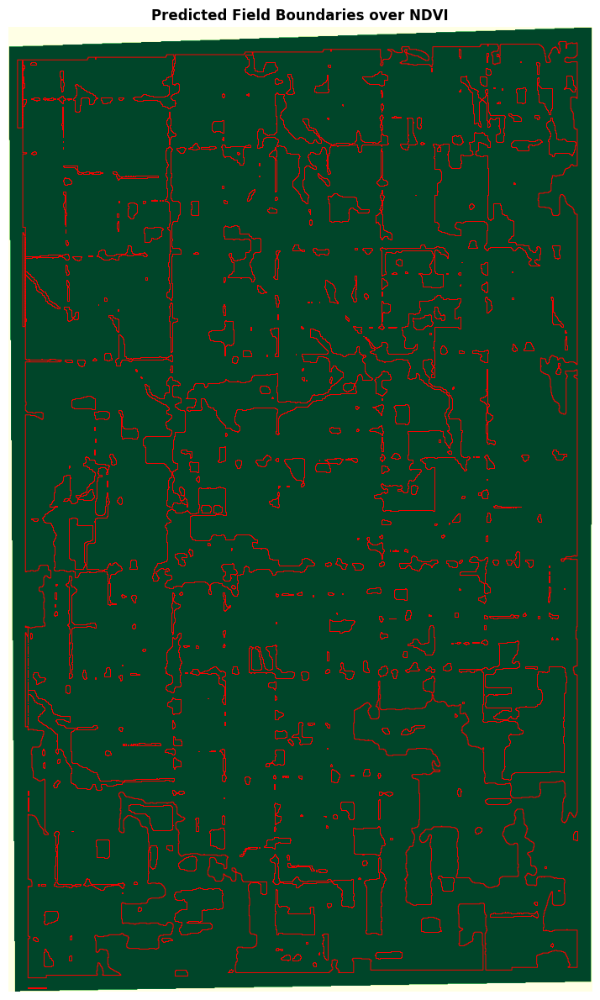

In [2]:
import rasterio
import geopandas as gpd
import matplotlib.pyplot as plt
from rasterio.plot import show

# === CONFIG ===
ndvi_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\AOI_NDVI_multidate_stack.tif"
shapefile_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\Huron_County_Prediction\field_boundaries_huron.shp"

# === Load NDVI Band (choose a mid-season date, e.g., band 3 or 4 if available) ===
with rasterio.open(ndvi_path) as src:
    ndvi_band = src.read(3)  # Change index based on date band
    ndvi_transform = src.transform
    ndvi_crs = src.crs

# === Load Field Boundaries ===
gdf = gpd.read_file(shapefile_path)
gdf = gdf.to_crs(ndvi_crs)

# === Plot ===
fig, ax = plt.subplots(figsize=(12, 12))
show(ndvi_band, transform=ndvi_transform, ax=ax, cmap="YlGn", title="Predicted Field Boundaries over NDVI")
gdf.boundary.plot(ax=ax, edgecolor="red", linewidth=0.7)

plt.axis("off")
plt.tight_layout()
plt.show()


In [3]:
import geopandas as gpd
import pandas as pd

# === Load predicted shapefile ===
shapefile_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\Huron_County_Prediction\field_boundaries_huron.shp"
gdf = gpd.read_file(shapefile_path)

# === Compute statistical summaries ===
summary = gdf[["area_m2", "area_acres"]].describe().T

# === Round for readability ===
summary = summary.round(2)

# === Save as CSV (optional) ===
summary_path = shapefile_path.replace(".shp", "_summary.csv")
summary.to_csv(summary_path)

# === Print to console ===
print("📊 Field Area Summary:")
print(summary)
print(f"\n✅ Summary saved to: {summary_path}")


📊 Field Area Summary:
            count        mean          std     min      25%      50%  \
area_m2      44.0  2159759.09  14151096.84  600.00  2175.00  6750.00   
area_acres   44.0      533.69      3496.81    0.15     0.54     1.67   

                 75%          max  
area_m2     18325.00  93893300.00  
area_acres      4.53     23201.54  

✅ Summary saved to: C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\Huron_County_Prediction\field_boundaries_huron_summary.csv


In [4]:
import geopandas as gpd

# === Path to the predicted shapefile for larger AOI ===
shapefile_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\Huron_County_Prediction\field_boundaries_huron.shp"

# === Load shapefile ===
gdf = gpd.read_file(shapefile_path)

# === If not already present, calculate area in m² and acres ===
if 'area_m2' not in gdf.columns:
    gdf["area_m2"] = gdf.geometry.area
    gdf["area_acres"] = gdf["area_m2"] / 4046.8564224

# === Calculate total predicted acreage ===
total_acres = gdf["area_acres"].sum()

# === Print result ===
print(f"📐 Total Predicted Field Area (acres): {total_acres:.2f}")


📐 Total Predicted Field Area (acres): 23482.28


In [5]:
import fiona
import numpy as np
import rasterio
import shapely.ops
from shapely.geometry import shape, Polygon, MultiPolygon, mapping
from pyproj import Transformer, CRS
import matplotlib.pyplot as plt
import rasterio.plot
from rasterio.features import geometry_mask


In [6]:
shapefile_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\Huron_County_Prediction\New_Cdl\new_cdl_polygons.shp"
# predicted_mask_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_binary_predicted_mask.tif"
predicted_mask_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\Huron_County_Prediction\field_binary_predicted_mask_huron.tif"


In [7]:
projected_geometries = []
transformer = Transformer.from_crs("EPSG:5070", "EPSG:32617", always_xy=True)

with fiona.open(shapefile_path, 'r') as src:
    for feature in src:
        crop_class = feature['properties'].get('DN')
        if crop_class is not None and crop_class > 0:
            geom = shape(feature['geometry'])
            if geom.is_valid and isinstance(geom, (Polygon, MultiPolygon)):
                geom_proj = shapely.ops.transform(transformer.transform, geom)
                projected_geometries.append(geom_proj)


In [8]:
with rasterio.open(predicted_mask_path) as src:
    raster_bounds = src.bounds
    raster_array = src.read(1)
    raster_transform = src.transform
    raster_crs = src.crs


In [9]:
minx, miny, maxx, maxy = np.inf, np.inf, -np.inf, -np.inf
for geom in projected_geometries:
    gxmin, gymin, gxmax, gymax = geom.bounds
    minx = min(minx, gxmin)
    miny = min(miny, gymin)
    maxx = max(maxx, gxmax)
    maxy = max(maxy, gymax)

vector_bounds_reprojected = (minx, miny, maxx, maxy)


In [10]:
polygon_mask = geometry_mask(
    geometries=[mapping(geom) for geom in projected_geometries],
    transform=raster_transform,
    invert=True,
    out_shape=raster_array.shape
)


In [11]:
overlap_area = np.logical_and(polygon_mask, raster_array == 1).sum()
raster_total = (raster_array == 1).sum()
polygon_total = polygon_mask.sum()

overlap_pct_of_raster = 100 * overlap_area / raster_total if raster_total else 0
overlap_pct_of_polygon = 100 * overlap_area / polygon_total if polygon_total else 0

print({
    "Total Predicted Mask Area (pixels)": raster_total,
    "Total Polygon Area (pixels)": polygon_total,
    "Overlapping Area (pixels)": overlap_area,
    "Overlap % of Raster": f"{overlap_pct_of_raster:.2f}%",
    "Overlap % of Polygons": f"{overlap_pct_of_polygon:.2f}%"
})


{'Total Predicted Mask Area (pixels)': 951676, 'Total Polygon Area (pixels)': 803466, 'Overlapping Area (pixels)': 700054, 'Overlap % of Raster': '73.56%', 'Overlap % of Polygons': '87.13%'}


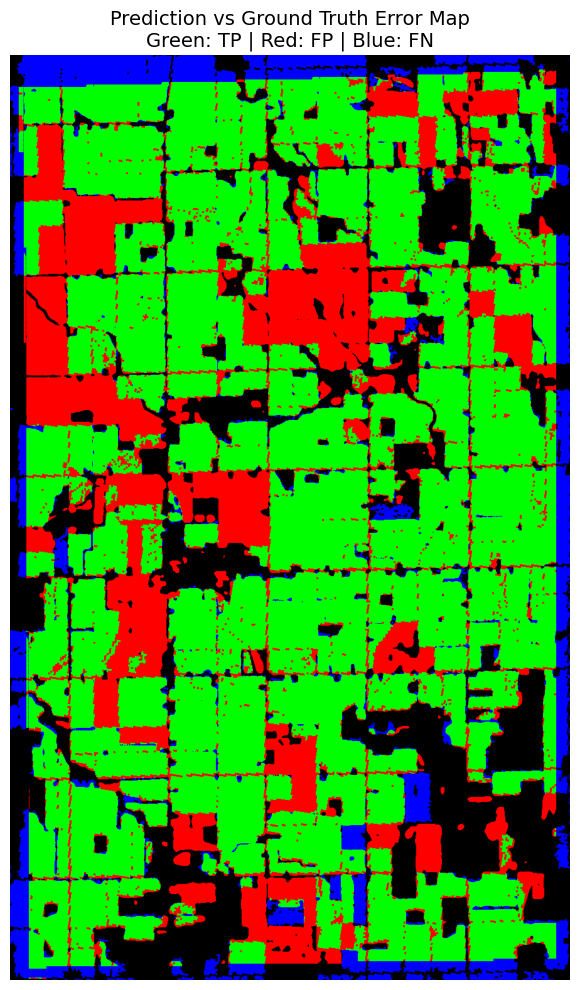

In [12]:
# Create masks
tp_mask = np.logical_and(polygon_mask, raster_array == 1)   # True Positives
fp_mask = np.logical_and(~polygon_mask, raster_array == 1)  # False Positives
fn_mask = np.logical_and(polygon_mask, raster_array == 0)   # False Negatives

# Create RGB overlay
overlay_rgb = np.zeros((raster_array.shape[0], raster_array.shape[1], 3), dtype=np.uint8)
overlay_rgb[tp_mask] = [0, 255, 0]    # Green: TP
overlay_rgb[fp_mask] = [255, 0, 0]    # Red: FP
overlay_rgb[fn_mask] = [0, 0, 255]    # Blue: FN

# Plot error map
fig, ax = plt.subplots(figsize=(12, 10))
ax.imshow(overlay_rgb)
ax.set_title("Prediction vs Ground Truth Error Map\nGreen: TP | Red: FP | Blue: FN", fontsize=14)
ax.axis('off')
plt.tight_layout()
plt.show()


In [13]:
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np

# Step 1: Flatten inputs
y_true = polygon_mask.flatten().astype(int)  # 1 = actual field, 0 = background
y_pred = (raster_array == 1).flatten().astype(int)  # 1 = predicted field

# Step 2: Confusion matrix & classification report
conf_matrix = confusion_matrix(y_true, y_pred)
class_report = classification_report(y_true, y_pred, target_names=['Background', 'Field'], output_dict=True)

# Step 3: Pixel-level metrics
TP = conf_matrix[1][1]
FP = conf_matrix[0][1]
FN = conf_matrix[1][0]
TN = conf_matrix[0][0]

intersection = TP
union = TP + FP + FN
iou = intersection / union if union else 0
pixel_accuracy = TP / (TP + FN) if (TP + FN) else 0

# Step 4: Acreage calculation
PIXEL_AREA_M2 = 100  # for 10m resolution
SQM_TO_ACRES = 1 / 4046.86

total_pred_pixels = (raster_array == 1).sum()
total_poly_pixels = polygon_mask.sum()

pred_area_m2 = total_pred_pixels * PIXEL_AREA_M2
true_area_m2 = total_poly_pixels * PIXEL_AREA_M2

pred_area_acres = pred_area_m2 * SQM_TO_ACRES
true_area_acres = true_area_m2 * SQM_TO_ACRES

error_acres = abs(pred_area_acres - true_area_acres)
error_percent = (error_acres / true_area_acres * 100) if true_area_acres else 0

# Step 5: Display results
metrics = {
    "Confusion Matrix": {
        "True Negative (Background)": int(TN),
        "False Positive": int(FP),
        "False Negative": int(FN),
        "True Positive (Field)": int(TP),
    },
    "Classification Report": {
        "Precision (Field)": f"{class_report['Field']['precision']:.2f}",
        "Recall (Field)": f"{class_report['Field']['recall']:.2f}",
        "F1-Score (Field)": f"{class_report['Field']['f1-score']:.2f}",
        "Overall Accuracy": f"{class_report['accuracy']:.2f}"
    },
    "Pixel-Level Metrics": {
        "Pixel Accuracy (Recall)": f"{pixel_accuracy:.2%}",
        "IoU (Jaccard Index)": f"{iou:.2%}"
    },
    "Acreage Comparison": {
        "Predicted Acreage": round(pred_area_acres, 2),
        "Shapefile Acreage": round(true_area_acres, 2),
        "Acreage Error": round(error_acres, 2),
        "Error Percentage": f"{error_percent:.2f}%"
    }
}

import pprint
pprint.pprint(metrics)


{'Acreage Comparison': {'Acreage Error': 3662.35,
                        'Error Percentage': '18.45%',
                        'Predicted Acreage': 23516.41,
                        'Shapefile Acreage': 19854.06},
 'Classification Report': {'F1-Score (Field)': '0.80',
                           'Overall Accuracy': '0.73',
                           'Precision (Field)': '0.74',
                           'Recall (Field)': '0.87'},
 'Confusion Matrix': {'False Negative': 103412,
                      'False Positive': 251622,
                      'True Negative (Background)': 260612,
                      'True Positive (Field)': 700054},
 'Pixel-Level Metrics': {'IoU (Jaccard Index)': '66.35%',
                         'Pixel Accuracy (Recall)': '87.13%'}}


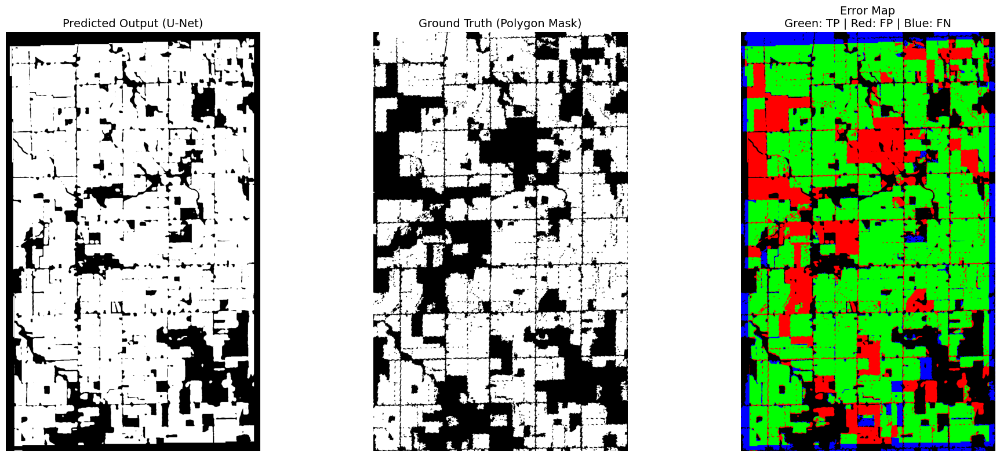

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.features import geometry_mask
import fiona
import shapely.ops
from shapely.geometry import shape, Polygon, MultiPolygon, mapping
from pyproj import Transformer

# === File Paths ===
# predicted_mask_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\field_binary_predicted_mask.tif"
predicted_mask_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\Huron_County_Prediction\field_binary_predicted_mask_huron.tif"
shapefile_path = r"C:\Users\gagan\OneDrive\Desktop\GMU\DAEN_690\Sentinel_2_Data\NDVI\NDVI_Clipped_25_03\Binary_Segmentation_Outputs\Huron_County_Prediction\New_Cdl\new_cdl_polygons.shp"

# === Load Predicted Mask Raster ===
with rasterio.open(predicted_mask_path) as src:
    raster_array = src.read(1)
    raster_transform = src.transform
    raster_crs = src.crs

# === Load and Reproject Shapefile ===
projected_geometries = []
transformer = Transformer.from_crs("EPSG:5070", "EPSG:32617", always_xy=True)

with fiona.open(shapefile_path, 'r') as src:
    for feature in src:
        crop_class = feature['properties'].get('DN')
        if crop_class is not None and crop_class > 0:
            geom = shape(feature['geometry'])
            if geom.is_valid and isinstance(geom, (Polygon, MultiPolygon)):
                geom_proj = shapely.ops.transform(transformer.transform, geom)
                projected_geometries.append(geom_proj)

# === Create Ground Truth Polygon Mask ===
polygon_mask = geometry_mask(
    geometries=[mapping(geom) for geom in projected_geometries],
    transform=raster_transform,
    invert=True,
    out_shape=raster_array.shape
)

# === Create TP, FP, FN Masks ===
tp_mask = np.logical_and(polygon_mask, raster_array == 1)
fp_mask = np.logical_and(~polygon_mask, raster_array == 1)
fn_mask = np.logical_and(polygon_mask, raster_array == 0)

# === Create RGB Error Overlay ===
overlay_rgb = np.zeros((raster_array.shape[0], raster_array.shape[1], 3), dtype=np.uint8)
overlay_rgb[tp_mask] = [0, 255, 0]    # Green = TP
overlay_rgb[fp_mask] = [255, 0, 0]    # Red = FP
overlay_rgb[fn_mask] = [0, 0, 255]    # Blue = FN

# === Plot Visualization ===
fig, axs = plt.subplots(1, 3, figsize=(20, 8))

# Panel 1: Predicted Mask
axs[0].imshow(raster_array, cmap='gray')
axs[0].set_title("Predicted Output (U-Net)", fontsize=14)
axs[0].axis('off')

# Panel 2: Ground Truth
axs[1].imshow(polygon_mask, cmap='gray')
axs[1].set_title("Ground Truth (Polygon Mask)", fontsize=14)
axs[1].axis('off')

# Panel 3: Error Map
axs[2].imshow(overlay_rgb)
axs[2].set_title("Error Map\nGreen: TP | Red: FP | Blue: FN", fontsize=14)
axs[2].axis('off')

plt.tight_layout()
plt.show()


In [15]:
import os
import time
import torch
import torch.nn as nn
import numpy as np
import platform
import psutil
from torchinfo import summary

# === U-Net Model Definition (Same as Training) ===
class UNet(nn.Module):
    def __init__(self, in_channels):
        super(UNet, self).__init__()
        def conv_block(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, kernel_size=3, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_c, out_c, kernel_size=3, padding=1),
                nn.ReLU(inplace=True),
            )
        self.enc1 = conv_block(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = conv_block(64, 128)
        self.pool2 = nn.MaxPool2d(2)

        self.bottleneck = conv_block(128, 256)

        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = conv_block(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = conv_block(128, 64)

        self.final = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool1(e1))
        b = self.bottleneck(self.pool2(e2))
        d2 = self.dec2(torch.cat([self.up2(b), e2], dim=1))
        d1 = self.dec1(torch.cat([self.up1(d2), e1], dim=1))
        return self.final(d1)

# === Load Model & Device ===
model_path = "unet_binary.pth"  # change path if needed
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet(in_channels=5)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()

# === Model Size ===
model_size_mb = os.path.getsize(model_path) / (1024 * 1024)

# === Parameters ===
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

# === Inference Time ===
dummy_input = torch.randn(1, 5, 256, 256).to(device)
start = time.time()
with torch.no_grad():
    _ = model(dummy_input)
end = time.time()
inference_time = end - start

# === Hardware Specs ===
hardware_info = {
    "CPU": platform.processor(),
    "RAM (GB)": round(psutil.virtual_memory().total / (1024 ** 3), 2),
    "GPU": torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU"
}

# === Output Report ===
print("\n===== U-Net Training & Deployment Metrics =====")
print(f"Model Size: {model_size_mb:.2f} MB")
print(f"Total Parameters: {total_params:,}")
print(f"Trainable Parameters: {trainable_params:,}")
print(f"Inference Time (256x256 input): {inference_time:.4f} seconds")
print("Device Used:", device)
print("Hardware Info:", hardware_info)



===== U-Net Training & Deployment Metrics =====
Model Size: 7.12 MB
Total Parameters: 1,864,001
Trainable Parameters: 1,864,001
Inference Time (256x256 input): 0.1453 seconds
Device Used: cuda
Hardware Info: {'CPU': 'Intel64 Family 6 Model 183 Stepping 1, GenuineIntel', 'RAM (GB)': 15.73, 'GPU': 'NVIDIA GeForce RTX 4060 Ti'}
